## **Loading the data**

In [ ]:
import os
import re
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import random

import tensorflow as tf
from keras.preprocessing import image
from keras.preprocessing.image import ImageDataGenerator
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from keras.metrics import Precision, Recall
from keras.models import Sequential, Model
from keras.layers import Dense,Conv2D,Dropout,Flatten,MaxPooling2D, BatchNormalization,Input, GlobalAveragePooling2D, concatenate
from keras.callbacks import EarlyStopping,ReduceLROnPlateau
from keras.utils import plot_model
from keras.optimizers import Adam
from sklearn.metrics import classification_report, confusion_matrix

from keras.applications.inception_v3 import InceptionV3

from sklearn.metrics import classification_report

In [ ]:
base_path = '/content/drive/MyDrive/Untitled folder/bilateral/'
categories = {  0: "0", 1: "1", 2: "2", 3: "3", 4: "4", 5: "5", 6: "6", 7: "7", 8: "8", 9: "9", 10: "a", 11: "b", 12: "c", 13: "d", 14: "e", 15: "f", 16: "g", 17: "h", 18: "i", 19: "j", 20: "k", 21: "l", 22: "m", 23: "n", 24: "o", 25: "p", 26: "q", 27: "r", 28: "s", 29: "t",30: "u",31: "v",32: "w",33: "x",34: "y",35: "z",}

def add_class_name_prefix(df, col_name):
    df[col_name] = df[col_name].apply(
        lambda x: x[re.search("_", x).start() + 1 : re.search("_", x).start() + 2]
        + "/"
        + x
    )
    return df

filenames_list = []
categories_list = []

for category in categories:
    filenames = os.listdir(base_path + categories[category])
    filenames_list = filenames_list + filenames
    categories_list = categories_list + [category] * len(filenames)

df = pd.DataFrame({"filename": filenames_list, "category": categories_list})
df = add_class_name_prefix(df, "filename")

# Shuffle the dataframe
df = df.sample(frac=1).reset_index(drop=True)

In [ ]:
# train_path = '/kaggle/working/train'
# val_path = '/kaggle/working/val'
# test_path = '/kaggle/working/test'

In [ ]:
IMAGE_WIDTH = 224
IMAGE_HEIGHT = 224
BATCH_SIZE = 32
IMAGE_CHANNELS = 3
IMAGE_SIZE = (IMAGE_WIDTH, IMAGE_HEIGHT)
IMAGE_SHAPE = (IMAGE_WIDTH, IMAGE_HEIGHT, IMAGE_CHANNELS)

In [ ]:
df["category"] = df["category"].replace(categories)

train_df, validate_df = train_test_split(df, test_size=0.25, random_state=42)
validate_df, test_df = train_test_split(validate_df, test_size=0.5, random_state=42)

train_df = train_df.reset_index(drop=True)
validate_df = validate_df.reset_index(drop=True)
test_df = test_df.reset_index(drop=True)

total_train = train_df.shape[0]
total_validate = validate_df.shape[0]
total_test = test_df.shape[0]
print(
    "train size =",
    total_train,
    "validate size =",
    total_validate,
    "test size =",
    test_df.shape[0],
)

train size = 1902 validate size = 317 test size = 317


In [ ]:
train_df, validate_df = train_test_split(df, test_size=0.25, random_state=42)
validate_df, test_df = train_test_split(validate_df, test_size=0.5, random_state=42)

In [ ]:
datagen = image.ImageDataGenerator(rescale = 1.0 / 255)

In [ ]:
train_generator = datagen.flow_from_dataframe(
    train_df,
    base_path,
    x_col="filename",
    y_col="category",
    target_size=IMAGE_SIZE,
    class_mode="categorical",
    batch_size=BATCH_SIZE,
)

validation_generator = datagen.flow_from_dataframe(
    validate_df,
    base_path,
    x_col="filename",
    y_col="category",
    target_size=IMAGE_SIZE,
    class_mode="categorical",
    batch_size=BATCH_SIZE,
)

test_generator = datagen.flow_from_dataframe(
    test_df,
    base_path,
    x_col="filename",
    y_col="category",
    target_size=IMAGE_SIZE,
    color_mode="rgb",
    class_mode="categorical",
    batch_size=1,
    shuffle=False,
)

Found 1902 validated image filenames belonging to 36 classes.
Found 317 validated image filenames belonging to 36 classes.
Found 317 validated image filenames belonging to 36 classes.


In [ ]:
EPOCHS = 50
learning_rate_reduction = ReduceLROnPlateau(
    monitor="val_accuracy", patience=3, verbose=1, factor=0.3, min_lr=0.0000001
)
early_stop = EarlyStopping(
    patience=10,
    verbose=1,
    monitor="val_accuracy",
    mode="max",
    min_delta=0.001,
    restore_best_weights=True,
)

In [ ]:
STEP_SIZE_TRAIN = train_generator.n // train_generator.batch_size
STEP_SIZE_VALID = validation_generator.n // validation_generator.batch_size

## **SqueezeNet**

In [ ]:
bnmomemtum = 0.9

def fire_module(x, squeeze, expand):
    y = Conv2D(filters=squeeze, kernel_size=1, activation="relu", padding="same")(x)
    y = BatchNormalization(momentum=bnmomemtum)(y)
    y1 = Conv2D(filters=expand // 2, kernel_size=1, activation="relu", padding="same")(y)
    y1 = BatchNormalization(momentum=bnmomemtum)(y1)
    y3 = Conv2D(filters=expand // 2, kernel_size=3, activation="relu", padding="same")(y)
    y3 = BatchNormalization(momentum=bnmomemtum)(y3)
    return concatenate([y1, y3])

def SqueezeNet(input_shape, num_classes):
    input = Input(shape=input_shape)
    y = Conv2D(kernel_size=7, filters=96, strides=2, padding="same", activation="relu")(input)
    y = BatchNormalization(momentum=bnmomemtum)(y)
    y = MaxPooling2D(pool_size=3, strides=2)(y)
    y = fire_module(y, 16, 64)
    y = fire_module(y, 16, 64)
    y = fire_module(y, 32, 128)
    y = MaxPooling2D(pool_size=3, strides=2)(y)
    y = fire_module(y, 32, 128)
    y = fire_module(y, 48, 192)
    y = fire_module(y, 48, 192)
    y = fire_module(y, 64, 256)
    y = MaxPooling2D(pool_size=2)(y)
    y = fire_module(y, 64, 256)
    y = Conv2D(kernel_size=1, filters=1000, strides=1, padding="same", activation="relu")(y)
    y = GlobalAveragePooling2D()(y)
    y = Dense(num_classes, activation="softmax")(y)
    model = Model(input, y)
    return model

In [ ]:
squeezenet_model = SqueezeNet(
    input_shape=(IMAGE_WIDTH, IMAGE_HEIGHT, IMAGE_CHANNELS), num_classes=len(categories)
)
squeezenet_model.compile(optimizer="adam", loss="categorical_crossentropy", metrics=["accuracy"])
squeezenet_model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 conv2d (Conv2D)             (None, 112, 112, 96)         14208     ['input_1[0][0]']             
                                                                                                  
 batch_normalization (Batch  (None, 112, 112, 96)         384       ['conv2d[0][0]']              
 Normalization)                                                                                   
                                                                                                  
 max_pooling2d (MaxPooling2  (None, 55, 55, 96)           0         ['batch_normalization[0][0

In [ ]:
squeezenet_history = squeezenet_model.fit(
    train_generator,
    epochs=EPOCHS,
    validation_data=validation_generator,
    validation_steps=total_validate // BATCH_SIZE,
    steps_per_epoch=total_train // BATCH_SIZE,
    callbacks=[learning_rate_reduction, early_stop],
)

Epoch 1/50
59/59 [==============================] - 719s 12s/step - loss: 2.4134 - accuracy: 0.3091 - val_loss: 2.7299 - val_accuracy: 0.3021 - lr: 0.0010
Epoch 2/50
59/59 [==============================] - 10s 161ms/step - loss: 1.1178 - accuracy: 0.6278 - val_loss: 3.2118 - val_accuracy: 0.2882 - lr: 0.0010
Epoch 3/50
59/59 [==============================] - 9s 146ms/step - loss: 0.7347 - accuracy: 0.7604 - val_loss: 1.0209 - val_accuracy: 0.6562 - lr: 0.0010
Epoch 4/50
59/59 [==============================] - 8s 130ms/step - loss: 0.4922 - accuracy: 0.8305 - val_loss: 0.8373 - val_accuracy: 0.7014 - lr: 0.0010
Epoch 5/50
59/59 [==============================] - 9s 158ms/step - loss: 0.4446 - accuracy: 0.8471 - val_loss: 0.6773 - val_accuracy: 0.7569 - lr: 0.0010
Epoch 6/50
59/59 [==============================] - 8s 139ms/step - loss: 0.4221 - accuracy: 0.8529 - val_loss: 1.1056 - val_accuracy: 0.6424 - lr: 0.0010
Epoch 7/50
59/59 [==============================] - 8s 133ms/step - l

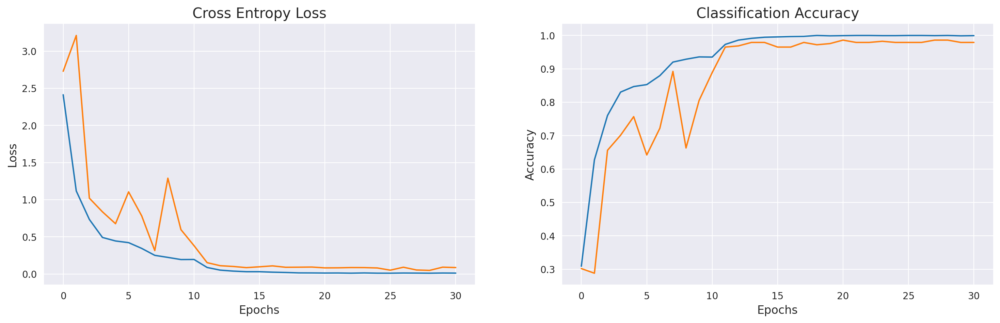

In [ ]:
error = pd.DataFrame(squeezenet_history.history)

plt.figure(figsize=(18,5),dpi=200)
sns.set_style('darkgrid')

plt.subplot(121)
plt.title('Cross Entropy Loss',fontsize=15)
plt.xlabel('Epochs',fontsize=12)
plt.ylabel('Loss',fontsize=12)
plt.plot(error['loss'])
plt.plot(error['val_loss'])

plt.subplot(122)
plt.title('Classification Accuracy',fontsize=15)
plt.xlabel('Epochs',fontsize=12)
plt.ylabel('Accuracy',fontsize=12)
plt.plot(error['accuracy'])
plt.plot(error['val_accuracy'])

plt.show()

In [ ]:
result = squeezenet_model.predict(test_generator,verbose = 0)
y_pred = np.argmax(result, axis = 1)
y_true = test_generator.labels

classes = list(train_generator.class_indices.keys())
clf_rep = classification_report(test_generator.classes, y_pred, target_names=classes, output_dict=True)

precision = [clf_rep[class_name]['precision'] for class_name in classes]
recall = [clf_rep[class_name]['recall'] for class_name in classes]
f1_score = [clf_rep[class_name]['f1-score'] for class_name in classes]

print('Classification Report')
print(classification_report(test_generator.classes, y_pred, target_names=classes))

loss,acc = squeezenet_model.evaluate(test_generator,verbose = 0)

print('Accuracy:',acc*100)
print('Loss:',loss)

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.83      0.91        12
           1       0.90      1.00      0.95         9
           2       1.00      1.00      1.00         8
           3       1.00      1.00      1.00        10
           4       1.00      1.00      1.00         7
           5       1.00      1.00      1.00        12
           6       1.00      1.00      1.00         7
           7       1.00      1.00      1.00         7
           8       1.00      1.00      1.00        13
           9       1.00      1.00      1.00        11
           a       1.00      1.00      1.00         9
           b       1.00      1.00      1.00        10
           c       1.00      1.00      1.00        11
           d       1.00      1.00      1.00         7
           e       1.00      1.00      1.00         7
           f       1.00      1.00      1.00         9
           g       1.00      1.00      1.00         9
     

## **InceptionV3**

In [ ]:
pre_trained = InceptionV3(weights='imagenet', include_top=False, input_shape=IMAGE_SHAPE, pooling='avg')

for layer in pre_trained.layers:
    layer.trainable = False

87910968/87910968 [==============================] - 0s 0us/step


In [ ]:
x = pre_trained.output
x = BatchNormalization()(x)
x = Dense(1024, activation='relu')(x)
x = Dropout(0.2)(x)
predictions = Dense(36, activation='softmax')(x)

inception_model = Model(inputs = pre_trained.input, outputs = predictions)
inception_model.compile(optimizer = Adam(learning_rate=0.001), loss='categorical_crossentropy', metrics=['accuracy'])
inception_model.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_2 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 conv2d_26 (Conv2D)          (None, 111, 111, 32)         864       ['input_2[0][0]']             
                                                                                                  
 batch_normalization_25 (Ba  (None, 111, 111, 32)         96        ['conv2d_26[0][0]']           
 tchNormalization)                                                                                
                                                                                                  
 activation (Activation)     (None, 111, 111, 32)         0         ['batch_normalization_25

In [ ]:
inception_history = inception_model.fit(
    train_generator,
    epochs=EPOCHS,
    validation_data=validation_generator,
    validation_steps=total_validate // BATCH_SIZE,
    steps_per_epoch=total_train // BATCH_SIZE,
    callbacks=[learning_rate_reduction, early_stop],
)

Epoch 1/50
59/59 [==============================] - 24s 212ms/step - loss: 1.3436 - accuracy: 0.7070 - val_loss: 1.2870 - val_accuracy: 0.6250 - lr: 0.0010
Epoch 2/50
59/59 [==============================] - 9s 144ms/step - loss: 0.2166 - accuracy: 0.9433 - val_loss: 0.6494 - val_accuracy: 0.7986 - lr: 0.0010
Epoch 3/50
59/59 [==============================] - 10s 172ms/step - loss: 0.0817 - accuracy: 0.9727 - val_loss: 0.4129 - val_accuracy: 0.8889 - lr: 0.0010
Epoch 4/50
59/59 [==============================] - 9s 147ms/step - loss: 0.0536 - accuracy: 0.9861 - val_loss: 0.4402 - val_accuracy: 0.8993 - lr: 0.0010
Epoch 5/50
59/59 [==============================] - 8s 143ms/step - loss: 0.0906 - accuracy: 0.9813 - val_loss: 0.3703 - val_accuracy: 0.9201 - lr: 0.0010
Epoch 6/50
59/59 [==============================] - 8s 139ms/step - loss: 0.1117 - accuracy: 0.9791 - val_loss: 0.3904 - val_accuracy: 0.9306 - lr: 0.0010
Epoch 7/50
59/59 [==============================] - 9s 158ms/step - 

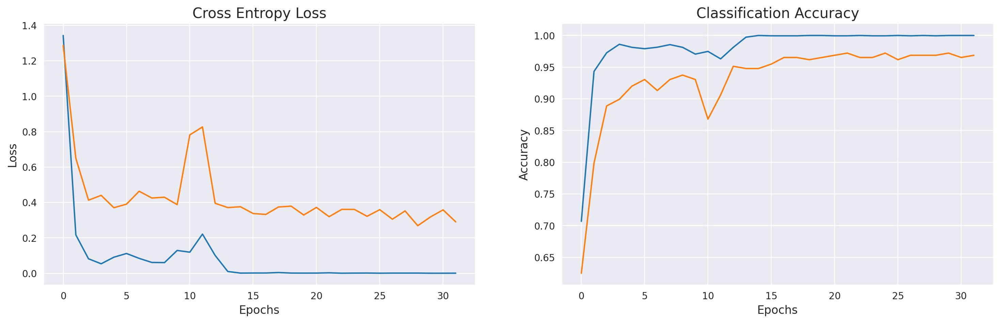

In [ ]:
error = pd.DataFrame(inception_history.history)

plt.figure(figsize=(18,5),dpi=200)
sns.set_style('darkgrid')

plt.subplot(121)
plt.title('Cross Entropy Loss',fontsize=15)
plt.xlabel('Epochs',fontsize=12)
plt.ylabel('Loss',fontsize=12)
plt.plot(error['loss'])
plt.plot(error['val_loss'])

plt.subplot(122)
plt.title('Classification Accuracy',fontsize=15)
plt.xlabel('Epochs',fontsize=12)
plt.ylabel('Accuracy',fontsize=12)
plt.plot(error['accuracy'])
plt.plot(error['val_accuracy'])

plt.show()

In [ ]:
result = inception_model.predict(test_generator,verbose = 0)

y_pred = np.argmax(result, axis = 1)

y_true = test_generator.labels

classes = list(train_generator.class_indices.keys())
clf_rep = classification_report(test_generator.classes, y_pred, target_names=classes, output_dict=True)

precision = [clf_rep[class_name]['precision'] for class_name in classes]
recall = [clf_rep[class_name]['recall'] for class_name in classes]
f1_score = [clf_rep[class_name]['f1-score'] for class_name in classes]

print('Classification Report')
print(classification_report(test_generator.classes, y_pred, target_names=classes))

loss,acc = inception_model.evaluate(test_generator,verbose = 0)

print('Accuracy:',acc*100)
print('Loss:',loss)

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.67      0.80        12
           1       1.00      1.00      1.00         9
           2       0.89      1.00      0.94         8
           3       1.00      1.00      1.00        10
           4       1.00      0.86      0.92         7
           5       1.00      1.00      1.00        12
           6       1.00      1.00      1.00         7
           7       0.86      0.86      0.86         7
           8       0.93      1.00      0.96        13
           9       1.00      1.00      1.00        11
           a       1.00      0.89      0.94         9
           b       1.00      1.00      1.00        10
           c       1.00      1.00      1.00        11
           d       1.00      1.00      1.00         7
           e       1.00      1.00      1.00         7
           f       1.00      1.00      1.00         9
           g       1.00      1.00      1.00         9
     

## **Xception**

In [ ]:
xcept = tf.keras.applications.Xception(weights = 'imagenet',
                                    include_top = False,
                                    input_shape = (224, 224, 3))

for layer in xcept.layers[:-5]:
    layer.trainable = False

83683744/83683744 [==============================] - 0s 0us/step


In [ ]:
x = xcept.output
x = Flatten()(x)
x = Dense(1024, activation='relu')(x)
x = Dropout(0.5)(x)
x = BatchNormalization()(x)
prediction = Dense(36, activation='softmax')(x)
xception_model = Model(xcept.input, prediction)
xception_model.compile(optimizer = Adam(learning_rate=0.001), loss='categorical_crossentropy', metrics=['accuracy'])

In [ ]:
xception_model.summary()

Model: "model_2"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_3 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 block1_conv1 (Conv2D)       (None, 111, 111, 32)         864       ['input_3[0][0]']             
                                                                                                  
 block1_conv1_bn (BatchNorm  (None, 111, 111, 32)         128       ['block1_conv1[0][0]']        
 alization)                                                                                       
                                                                                                  
 block1_conv1_act (Activati  (None, 111, 111, 32)         0         ['block1_conv1_bn[0][0]'

In [ ]:
xception_history = xception_model.fit(
    train_generator,
    epochs=EPOCHS,
    validation_data=validation_generator,
    validation_steps=total_validate // BATCH_SIZE,
    steps_per_epoch=total_train // BATCH_SIZE,
    callbacks=[learning_rate_reduction, early_stop],
)

Epoch 1/50
59/59 [==============================] - 26s 288ms/step - loss: 1.2359 - accuracy: 0.6684 - val_loss: 4.6473 - val_accuracy: 0.4479 - lr: 0.0010
Epoch 2/50
59/59 [==============================] - 13s 222ms/step - loss: 0.2804 - accuracy: 0.9235 - val_loss: 1.3822 - val_accuracy: 0.6458 - lr: 0.0010
Epoch 3/50
59/59 [==============================] - 12s 199ms/step - loss: 0.1004 - accuracy: 0.9749 - val_loss: 0.2834 - val_accuracy: 0.9201 - lr: 0.0010
Epoch 4/50
59/59 [==============================] - 11s 187ms/step - loss: 0.0454 - accuracy: 0.9914 - val_loss: 0.2602 - val_accuracy: 0.9132 - lr: 0.0010
Epoch 5/50
59/59 [==============================] - 12s 203ms/step - loss: 0.0393 - accuracy: 0.9925 - val_loss: 0.1556 - val_accuracy: 0.9514 - lr: 0.0010
Epoch 6/50
59/59 [==============================] - 11s 192ms/step - loss: 0.0240 - accuracy: 0.9957 - val_loss: 0.1451 - val_accuracy: 0.9514 - lr: 0.0010
Epoch 7/50
59/59 [==============================] - 12s 203ms/st

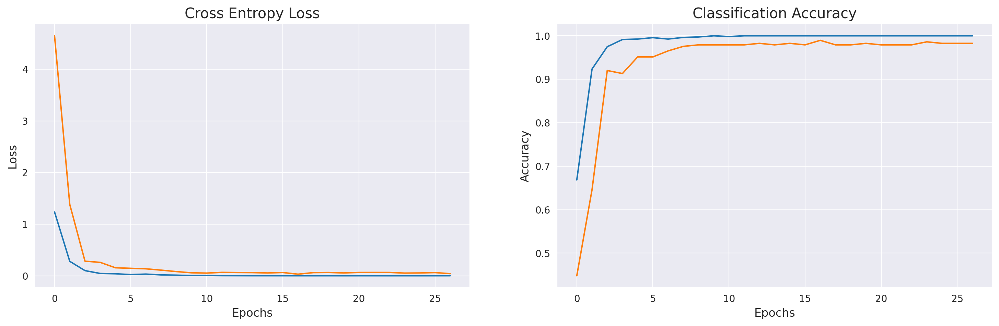

In [ ]:
error = pd.DataFrame(xception_history.history)

plt.figure(figsize=(18,5),dpi=200)
sns.set_style('darkgrid')

plt.subplot(121)
plt.title('Cross Entropy Loss',fontsize=15)
plt.xlabel('Epochs',fontsize=12)
plt.ylabel('Loss',fontsize=12)
plt.plot(error['loss'])
plt.plot(error['val_loss'])

plt.subplot(122)
plt.title('Classification Accuracy',fontsize=15)
plt.xlabel('Epochs',fontsize=12)
plt.ylabel('Accuracy',fontsize=12)
plt.plot(error['accuracy'])
plt.plot(error['val_accuracy'])

plt.show()

In [ ]:
result = xception_model.predict(test_generator,verbose = 0)
y_pred = np.argmax(result, axis = 1)
y_true = test_generator.labels

classes = list(train_generator.class_indices.keys())
clf_rep = classification_report(test_generator.classes, y_pred, target_names=classes, output_dict=True)

precision = [clf_rep[class_name]['precision'] for class_name in classes]
recall = [clf_rep[class_name]['recall'] for class_name in classes]
f1_score = [clf_rep[class_name]['f1-score'] for class_name in classes]

print('Classification Report')
print(classification_report(test_generator.classes, y_pred, target_names=classes))

loss,acc = xception_model.evaluate(test_generator,verbose = 0)

print('Accuracy:',acc*100)
print('Loss:',loss)

Classification Report
              precision    recall  f1-score   support

           0       0.90      0.75      0.82        12
           1       1.00      1.00      1.00         9
           2       1.00      1.00      1.00         8
           3       1.00      1.00      1.00        10
           4       1.00      1.00      1.00         7
           5       1.00      1.00      1.00        12
           6       1.00      1.00      1.00         7
           7       1.00      1.00      1.00         7
           8       1.00      1.00      1.00        13
           9       1.00      1.00      1.00        11
           a       1.00      0.89      0.94         9
           b       1.00      1.00      1.00        10
           c       1.00      1.00      1.00        11
           d       1.00      1.00      1.00         7
           e       1.00      1.00      1.00         7
           f       1.00      1.00      1.00         9
           g       1.00      1.00      1.00         9
     

## **VGG16**

In [ ]:
vgg = tf.keras.applications.VGG16(
    input_shape = (224, 224, 3),
    include_top = False,
    weights = 'imagenet')

vgg.trainable = False
# for layer in model.layers[:-5]:
#     layer.trainable = False

vgg.summary()

58889256/58889256 [==============================] - 0s 0us/step
Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_4 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                              

In [ ]:
vgg16_model = Sequential([
    vgg,
    BatchNormalization(),
    Flatten(),
    Dense(256, activation='relu'),
    Dense(36, activation='softmax')
])
vgg16_model.compile(optimizer = Adam(learning_rate=0.001), loss='categorical_crossentropy', metrics=['accuracy'])

In [ ]:
vgg16_history = vgg16_model.fit(
    train_generator,
    epochs=EPOCHS,
    validation_data=validation_generator,
    validation_steps=total_validate // BATCH_SIZE,
    steps_per_epoch=total_train // BATCH_SIZE,
    callbacks=[learning_rate_reduction, early_stop],
)

Epoch 1/50
59/59 [==============================] - 21s 224ms/step - loss: 1.2541 - accuracy: 0.7743 - val_loss: 0.7095 - val_accuracy: 0.8681 - lr: 0.0010
Epoch 2/50
59/59 [==============================] - 9s 155ms/step - loss: 0.1109 - accuracy: 0.9572 - val_loss: 0.4335 - val_accuracy: 0.9028 - lr: 0.0010
Epoch 3/50
59/59 [==============================] - 9s 156ms/step - loss: 0.0551 - accuracy: 0.9834 - val_loss: 0.2168 - val_accuracy: 0.9479 - lr: 0.0010
Epoch 4/50
59/59 [==============================] - 9s 156ms/step - loss: 0.0047 - accuracy: 0.9995 - val_loss: 0.1214 - val_accuracy: 0.9722 - lr: 0.0010
Epoch 5/50
59/59 [==============================] - 10s 176ms/step - loss: 0.0011 - accuracy: 1.0000 - val_loss: 0.1167 - val_accuracy: 0.9688 - lr: 0.0010
Epoch 6/50
59/59 [==============================] - 9s 146ms/step - loss: 6.7394e-04 - accuracy: 1.0000 - val_loss: 0.0921 - val_accuracy: 0.9688 - lr: 0.0010
Epoch 7/50
59/59 [==============================] - ETA: 0s - lo

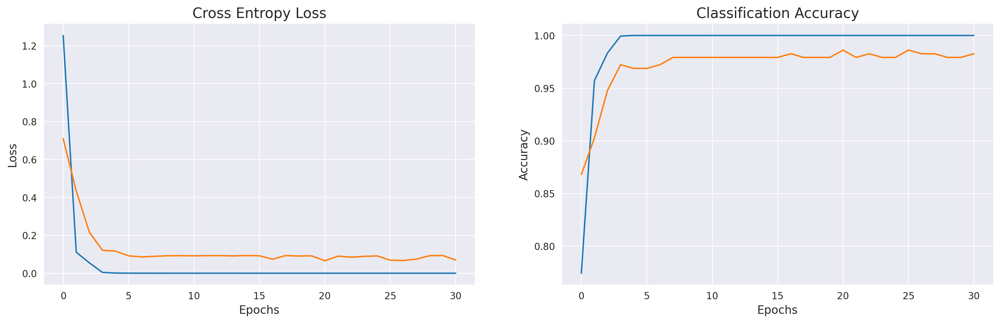

In [ ]:
error = pd.DataFrame(vgg16_history.history)

plt.figure(figsize=(18,5),dpi=200)
sns.set_style('darkgrid')

plt.subplot(121)
plt.title('Cross Entropy Loss',fontsize=15)
plt.xlabel('Epochs',fontsize=12)
plt.ylabel('Loss',fontsize=12)
plt.plot(error['loss'])
plt.plot(error['val_loss'])

plt.subplot(122)
plt.title('Classification Accuracy',fontsize=15)
plt.xlabel('Epochs',fontsize=12)
plt.ylabel('Accuracy',fontsize=12)
plt.plot(error['accuracy'])
plt.plot(error['val_accuracy'])

plt.show()

In [ ]:
result = vgg16_model.predict(test_generator,verbose = 0)
y_pred = np.argmax(result, axis = 1)
y_true = test_generator.labels

classes = list(train_generator.class_indices.keys())
clf_rep = classification_report(test_generator.classes, y_pred, target_names=classes, output_dict=True)

precision = [clf_rep[class_name]['precision'] for class_name in classes]
recall = [clf_rep[class_name]['recall'] for class_name in classes]
f1_score = [clf_rep[class_name]['f1-score'] for class_name in classes]

print('Classification Report')
print(classification_report(test_generator.classes, y_pred, target_names=classes))

loss,acc = vgg16_model.evaluate(test_generator,verbose = 0)

print('Accuracy:',acc*100)
print('Loss:',loss)

Classification Report
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        12
           1       1.00      1.00      1.00         9
           2       1.00      1.00      1.00         8
           3       1.00      1.00      1.00        10
           4       1.00      1.00      1.00         7
           5       1.00      1.00      1.00        12
           6       1.00      1.00      1.00         7
           7       1.00      1.00      1.00         7
           8       1.00      1.00      1.00        13
           9       1.00      1.00      1.00        11
           a       1.00      0.89      0.94         9
           b       1.00      1.00      1.00        10
           c       1.00      1.00      1.00        11
           d       0.88      1.00      0.93         7
           e       1.00      1.00      1.00         7
           f       1.00      1.00      1.00         9
           g       1.00      1.00      1.00         9
     

## **VGG19**

In [ ]:
vgg19 = tf.keras.applications.VGG19(
    input_shape = (224, 224, 3),
    include_top = False,
    weights = 'imagenet')

vgg19.trainable = False
# for layer in model.layers[:-5]:
#     layer.trainable = False

vgg19.summary()

80134624/80134624 [==============================] - 0s 0us/step
Model: "vgg19"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_5 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                              

In [ ]:
vgg19_model = Sequential([
    vgg19,
    BatchNormalization(),
    Flatten(),
    Dense(256, activation='relu'),
    Dense(36, activation='softmax')
])
vgg19_model.compile(optimizer = Adam(learning_rate=0.001), loss='categorical_crossentropy', metrics=['accuracy'])

In [ ]:
vgg19_history = vgg19_model.fit(
    train_generator,
    epochs=EPOCHS,
    validation_data=validation_generator,
    validation_steps=total_validate // BATCH_SIZE,
    steps_per_epoch=total_train // BATCH_SIZE,
    callbacks=[learning_rate_reduction, early_stop],
)

Epoch 1/50
59/59 [==============================] - 14s 206ms/step - loss: 1.3432 - accuracy: 0.7604 - val_loss: 0.9670 - val_accuracy: 0.8507 - lr: 0.0010
Epoch 2/50
59/59 [==============================] - 12s 199ms/step - loss: 0.0772 - accuracy: 0.9759 - val_loss: 0.4604 - val_accuracy: 0.9340 - lr: 0.0010
Epoch 3/50
59/59 [==============================] - 11s 180ms/step - loss: 0.0527 - accuracy: 0.9834 - val_loss: 0.3508 - val_accuracy: 0.9410 - lr: 0.0010
Epoch 4/50
59/59 [==============================] - 11s 181ms/step - loss: 0.0393 - accuracy: 0.9914 - val_loss: 0.2133 - val_accuracy: 0.9549 - lr: 0.0010
Epoch 5/50
59/59 [==============================] - 11s 177ms/step - loss: 0.0451 - accuracy: 0.9882 - val_loss: 0.2914 - val_accuracy: 0.9340 - lr: 0.0010
Epoch 6/50
59/59 [==============================] - 11s 183ms/step - loss: 0.0842 - accuracy: 0.9791 - val_loss: 0.1796 - val_accuracy: 0.9514 - lr: 0.0010
Epoch 7/50
59/59 [==============================] - 11s 182ms/st

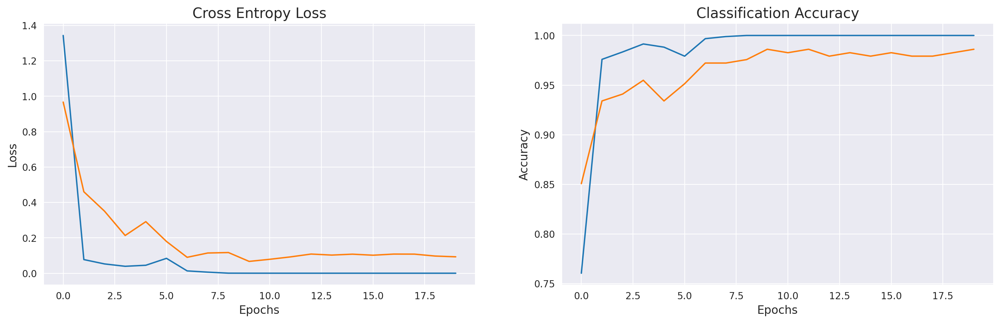

In [ ]:
error = pd.DataFrame(vgg19_history.history)

plt.figure(figsize=(18,5),dpi=200)
sns.set_style('darkgrid')

plt.subplot(121)
plt.title('Cross Entropy Loss',fontsize=15)
plt.xlabel('Epochs',fontsize=12)
plt.ylabel('Loss',fontsize=12)
plt.plot(error['loss'])
plt.plot(error['val_loss'])

plt.subplot(122)
plt.title('Classification Accuracy',fontsize=15)
plt.xlabel('Epochs',fontsize=12)
plt.ylabel('Accuracy',fontsize=12)
plt.plot(error['accuracy'])
plt.plot(error['val_accuracy'])

plt.show()

In [ ]:
result = vgg19_model.predict(test_generator,verbose = 0)
y_pred = np.argmax(result, axis = 1)
y_true = test_generator.labels

classes = list(train_generator.class_indices.keys())
clf_rep = classification_report(test_generator.classes, y_pred, target_names=classes, output_dict=True)

precision = [clf_rep[class_name]['precision'] for class_name in classes]
recall = [clf_rep[class_name]['recall'] for class_name in classes]
f1_score = [clf_rep[class_name]['f1-score'] for class_name in classes]

print('Classification Report')
print(classification_report(test_generator.classes, y_pred, target_names=classes))

loss,acc = vgg19_model.evaluate(test_generator,verbose = 0)

print('Accuracy:',acc*100)
print('Loss:',loss)

Classification Report
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        12
           1       0.90      1.00      0.95         9
           2       1.00      1.00      1.00         8
           3       1.00      1.00      1.00        10
           4       1.00      1.00      1.00         7
           5       1.00      1.00      1.00        12
           6       1.00      1.00      1.00         7
           7       1.00      1.00      1.00         7
           8       1.00      1.00      1.00        13
           9       1.00      1.00      1.00        11
           a       1.00      0.89      0.94         9
           b       1.00      1.00      1.00        10
           c       1.00      1.00      1.00        11
           d       1.00      1.00      1.00         7
           e       1.00      1.00      1.00         7
           f       1.00      1.00      1.00         9
           g       1.00      1.00      1.00         9
     

## **ResNet50**

In [ ]:
resnet = tf.keras.applications.ResNet50(
    weights = 'imagenet',
    include_top = False,
    input_shape = (224,224,3)
)
resnet.summary()

94765736/94765736 [==============================] - 0s 0us/step
Model: "resnet50"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_6 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 conv1_pad (ZeroPadding2D)   (None, 230, 230, 3)          0         ['input_6[0][0]']             
                                                                                                  
 conv1_conv (Conv2D)         (None, 112, 112, 64)         9472      ['conv1_pad[0][0]']           
                                                                                                  
 conv1_bn (BatchNormalizati  (None, 112, 112, 64)         256       ['conv1_conv[0][0]']          
 on)                      

In [ ]:
model_50 = Sequential([
    resnet,
    BatchNormalization(),
    Flatten(),
    Dense(256, activation='relu'),
    Dense(36, activation='softmax')
])
model_50.compile(optimizer = Adam(learning_rate=0.001), loss='categorical_crossentropy', metrics=['accuracy'])

In [ ]:
history_50 = model_50.fit(
    train_generator,
    epochs=EPOCHS,
    validation_data=validation_generator,
    validation_steps=total_validate // BATCH_SIZE,
    steps_per_epoch=total_train // BATCH_SIZE,
    callbacks=[learning_rate_reduction, early_stop],
)

Epoch 1/50
59/59 [==============================] - 66s 461ms/step - loss: 4.2120 - accuracy: 0.6380 - val_loss: 2132.6985 - val_accuracy: 0.0208 - lr: 0.0010
Epoch 2/50
59/59 [==============================] - 22s 373ms/step - loss: 0.8136 - accuracy: 0.8727 - val_loss: 4.5787 - val_accuracy: 0.0312 - lr: 0.0010
Epoch 3/50
59/59 [==============================] - 24s 401ms/step - loss: 0.7443 - accuracy: 0.8941 - val_loss: 6.6407 - val_accuracy: 0.0174 - lr: 0.0010
Epoch 4/50
59/59 [==============================] - 22s 373ms/step - loss: 0.5371 - accuracy: 0.9048 - val_loss: 5.5424 - val_accuracy: 0.0347 - lr: 0.0010
Epoch 5/50
59/59 [==============================] - 22s 371ms/step - loss: 0.3595 - accuracy: 0.9439 - val_loss: 7.2013 - val_accuracy: 0.0278 - lr: 0.0010
Epoch 6/50
59/59 [==============================] - 22s 374ms/step - loss: 0.3433 - accuracy: 0.9465 - val_loss: 6.6451 - val_accuracy: 0.0312 - lr: 0.0010
Epoch 7/50
59/59 [==============================] - ETA: 0s -

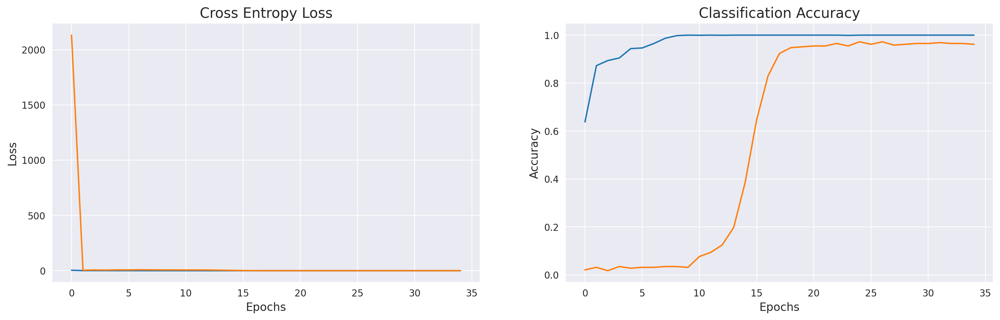

In [ ]:
error = pd.DataFrame(history_50.history)

plt.figure(figsize=(18,5),dpi=200)
sns.set_style('darkgrid')

plt.subplot(121)
plt.title('Cross Entropy Loss',fontsize=15)
plt.xlabel('Epochs',fontsize=12)
plt.ylabel('Loss',fontsize=12)
plt.plot(error['loss'])
plt.plot(error['val_loss'])

plt.subplot(122)
plt.title('Classification Accuracy',fontsize=15)
plt.xlabel('Epochs',fontsize=12)
plt.ylabel('Accuracy',fontsize=12)
plt.plot(error['accuracy'])
plt.plot(error['val_accuracy'])

plt.show()

In [ ]:
result = model_50.predict(test_generator,verbose = 0)
y_pred = np.argmax(result, axis = 1)
y_true = test_generator.labels

classes = list(train_generator.class_indices.keys())
clf_rep = classification_report(test_generator.classes, y_pred, target_names=classes, output_dict=True)

precision = [clf_rep[class_name]['precision'] for class_name in classes]
recall = [clf_rep[class_name]['recall'] for class_name in classes]
f1_score = [clf_rep[class_name]['f1-score'] for class_name in classes]

print('Classification Report')
print(classification_report(test_generator.classes, y_pred, target_names=classes))

loss,acc = model_50.evaluate(test_generator,verbose = 0)

print('Accuracy:',acc*100)
print('Loss:',loss)

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.83      0.91        12
           1       0.89      0.89      0.89         9
           2       0.89      1.00      0.94         8
           3       1.00      1.00      1.00        10
           4       1.00      1.00      1.00         7
           5       1.00      1.00      1.00        12
           6       1.00      1.00      1.00         7
           7       1.00      1.00      1.00         7
           8       1.00      1.00      1.00        13
           9       1.00      1.00      1.00        11
           a       1.00      0.89      0.94         9
           b       1.00      1.00      1.00        10
           c       1.00      1.00      1.00        11
           d       1.00      1.00      1.00         7
           e       1.00      1.00      1.00         7
           f       1.00      1.00      1.00         9
           g       1.00      1.00      1.00         9
     

## **ResNet50V2**

In [ ]:
resnetv2 = tf.keras.applications.ResNet50V2(
    weights = 'imagenet',
    include_top = False,
    input_shape = (224,224,3)
)
resnetv2.summary()

94668760/94668760 [==============================] - 1s 0us/step
Model: "resnet50v2"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_7 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 conv1_pad (ZeroPadding2D)   (None, 230, 230, 3)          0         ['input_7[0][0]']             
                                                                                                  
 conv1_conv (Conv2D)         (None, 112, 112, 64)         9472      ['conv1_pad[0][0]']           
                                                                                                  
 pool1_pad (ZeroPadding2D)   (None, 114, 114, 64)         0         ['conv1_conv[0][0]']          
                        

In [ ]:
model_50v2 = Sequential([
    resnetv2,
    BatchNormalization(),
    Flatten(),
    Dense(256, activation='relu'),
    Dense(36, activation='softmax')
])
model_50v2.compile(optimizer = Adam(learning_rate=0.001), loss='categorical_crossentropy', metrics=['accuracy'])

In [ ]:
history_50v2 = model_50v2.fit(
    train_generator,
    epochs=EPOCHS,
    validation_data=validation_generator,
    validation_steps=total_validate // BATCH_SIZE,
    steps_per_epoch=total_train // BATCH_SIZE,
    callbacks=[learning_rate_reduction, early_stop],
)

Epoch 1/50
59/59 [==============================] - 54s 403ms/step - loss: 2.0523 - accuracy: 0.6588 - val_loss: 464.9681 - val_accuracy: 0.0208 - lr: 0.0010
Epoch 2/50
59/59 [==============================] - 20s 335ms/step - loss: 0.4750 - accuracy: 0.8652 - val_loss: 57.6898 - val_accuracy: 0.3472 - lr: 0.0010
Epoch 3/50
59/59 [==============================] - 21s 347ms/step - loss: 0.3659 - accuracy: 0.9016 - val_loss: 20.0147 - val_accuracy: 0.3090 - lr: 0.0010
Epoch 4/50
59/59 [==============================] - 19s 327ms/step - loss: 0.2463 - accuracy: 0.9235 - val_loss: 1.8634 - val_accuracy: 0.6597 - lr: 0.0010
Epoch 5/50
59/59 [==============================] - 20s 332ms/step - loss: 0.1558 - accuracy: 0.9561 - val_loss: 1.7095 - val_accuracy: 0.7882 - lr: 0.0010
Epoch 6/50
59/59 [==============================] - 19s 327ms/step - loss: 0.1591 - accuracy: 0.9620 - val_loss: 13.2926 - val_accuracy: 0.7396 - lr: 0.0010
Epoch 7/50
59/59 [==============================] - 19s 325

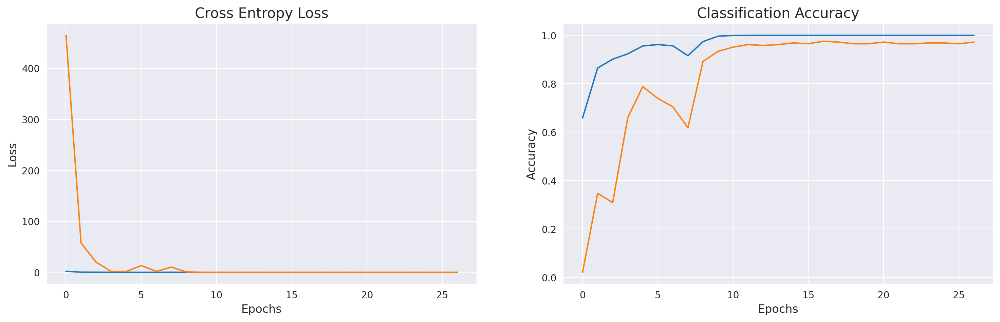

In [ ]:
error = pd.DataFrame(history_50v2.history)

plt.figure(figsize=(18,5),dpi=200)
sns.set_style('darkgrid')

plt.subplot(121)
plt.title('Cross Entropy Loss',fontsize=15)
plt.xlabel('Epochs',fontsize=12)
plt.ylabel('Loss',fontsize=12)
plt.plot(error['loss'])
plt.plot(error['val_loss'])

plt.subplot(122)
plt.title('Classification Accuracy',fontsize=15)
plt.xlabel('Epochs',fontsize=12)
plt.ylabel('Accuracy',fontsize=12)
plt.plot(error['accuracy'])
plt.plot(error['val_accuracy'])

plt.show()

In [ ]:
result = model_50v2.predict(test_generator,verbose = 0)
y_pred = np.argmax(result, axis = 1)
y_true = test_generator.labels

classes = list(train_generator.class_indices.keys())
clf_rep = classification_report(test_generator.classes, y_pred, target_names=classes, output_dict=True)

precision = [clf_rep[class_name]['precision'] for class_name in classes]
recall = [clf_rep[class_name]['recall'] for class_name in classes]
f1_score = [clf_rep[class_name]['f1-score'] for class_name in classes]

print('Classification Report')
print(classification_report(test_generator.classes, y_pred, target_names=classes))

loss,acc = model_50v2.evaluate(test_generator,verbose = 0)
print('The accuracy of the model for testing data is:',acc*100)
print('The Loss of the model for testing data is:',loss)

Classification Report
              precision    recall  f1-score   support

           0       0.89      0.67      0.76        12
           1       1.00      0.89      0.94         9
           2       1.00      1.00      1.00         8
           3       1.00      1.00      1.00        10
           4       1.00      1.00      1.00         7
           5       1.00      1.00      1.00        12
           6       1.00      1.00      1.00         7
           7       1.00      1.00      1.00         7
           8       1.00      1.00      1.00        13
           9       1.00      1.00      1.00        11
           a       0.90      1.00      0.95         9
           b       1.00      1.00      1.00        10
           c       1.00      1.00      1.00        11
           d       1.00      1.00      1.00         7
           e       1.00      1.00      1.00         7
           f       1.00      1.00      1.00         9
           g       1.00      1.00      1.00         9
     

## **InceptionResNetV2**

In [ ]:
irv2 = tf.keras.applications.InceptionResNetV2(
    weights = 'imagenet',
    include_top = False,
    input_shape = (224,224,3)
)
irv2.summary()

219055592/219055592 [==============================] - 1s 0us/step
Model: "inception_resnet_v2"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_8 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 conv2d_124 (Conv2D)         (None, 111, 111, 32)         864       ['input_8[0][0]']             
                                                                                                  
 batch_normalization_129 (B  (None, 111, 111, 32)         96        ['conv2d_124[0][0]']          
 atchNormalization)                                                                               
                                                                                                  
 activation_9

In [ ]:
model_irv2 = Sequential([
    resnetv2,
    BatchNormalization(),
    Flatten(),
    Dense(256, activation='relu'),
    Dense(36, activation='softmax')
])
model_irv2.compile(optimizer = Adam(learning_rate=0.001), loss='categorical_crossentropy', metrics=['accuracy'])

In [ ]:
history_irv2 = model_irv2.fit(
    train_generator,
    epochs=EPOCHS,
    validation_data=validation_generator,
    validation_steps=total_validate // BATCH_SIZE,
    steps_per_epoch=total_train // BATCH_SIZE,
    callbacks=[learning_rate_reduction, early_stop],
)

Epoch 1/50
59/59 [==============================] - 50s 352ms/step - loss: 1.4389 - accuracy: 0.7198 - val_loss: 743.2424 - val_accuracy: 0.0521 - lr: 0.0010
Epoch 2/50
59/59 [==============================] - 20s 331ms/step - loss: 0.3291 - accuracy: 0.9166 - val_loss: 131.2463 - val_accuracy: 0.1319 - lr: 0.0010
Epoch 3/50
59/59 [==============================] - 19s 327ms/step - loss: 0.4334 - accuracy: 0.9096 - val_loss: 132.0576 - val_accuracy: 0.0312 - lr: 0.0010
Epoch 4/50
59/59 [==============================] - 19s 319ms/step - loss: 0.7361 - accuracy: 0.8519 - val_loss: 1555.7400 - val_accuracy: 0.0278 - lr: 0.0010
Epoch 5/50
59/59 [==============================] - 19s 327ms/step - loss: 0.3496 - accuracy: 0.9198 - val_loss: 18.2903 - val_accuracy: 0.4757 - lr: 0.0010
Epoch 6/50
59/59 [==============================] - 20s 331ms/step - loss: 0.2247 - accuracy: 0.9519 - val_loss: 14.8665 - val_accuracy: 0.5417 - lr: 0.0010
Epoch 7/50
59/59 [==============================] - 1

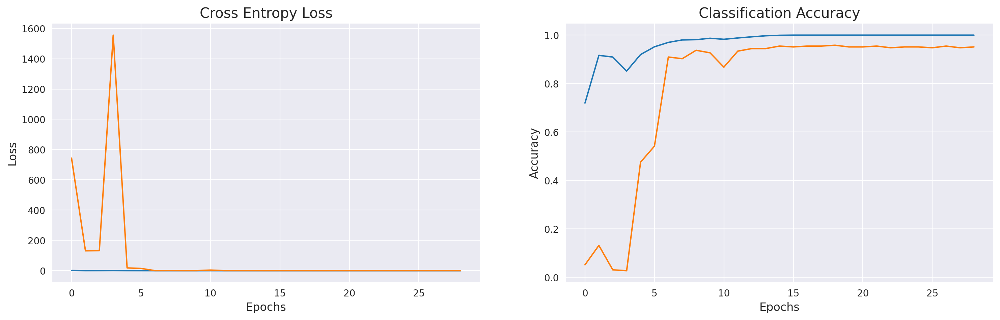

In [ ]:
error = pd.DataFrame(history_irv2.history)

plt.figure(figsize=(18,5),dpi=200)
sns.set_style('darkgrid')

plt.subplot(121)
plt.title('Cross Entropy Loss',fontsize=15)
plt.xlabel('Epochs',fontsize=12)
plt.ylabel('Loss',fontsize=12)
plt.plot(error['loss'])
plt.plot(error['val_loss'])

plt.subplot(122)
plt.title('Classification Accuracy',fontsize=15)
plt.xlabel('Epochs',fontsize=12)
plt.ylabel('Accuracy',fontsize=12)
plt.plot(error['accuracy'])
plt.plot(error['val_accuracy'])

plt.show()

In [ ]:
result = model_irv2.predict(test_generator,verbose = 0)
y_pred = np.argmax(result, axis = 1)
y_true = test_generator.labels

classes = list(train_generator.class_indices.keys())
clf_rep = classification_report(test_generator.classes, y_pred, target_names=classes, output_dict=True)

precision = [clf_rep[class_name]['precision'] for class_name in classes]
recall = [clf_rep[class_name]['recall'] for class_name in classes]
f1_score = [clf_rep[class_name]['f1-score'] for class_name in classes]

print('Classification Report')
print(classification_report(test_generator.classes, y_pred, target_names=classes))

loss,acc = model_irv2.evaluate(test_generator,verbose = 0)
print('The accuracy of the model for testing data is:',acc*100)
print('The Loss of the model for testing data is:',loss)

Classification Report
              precision    recall  f1-score   support

           0       0.91      0.83      0.87        12
           1       1.00      0.89      0.94         9
           2       0.89      1.00      0.94         8
           3       1.00      1.00      1.00        10
           4       1.00      1.00      1.00         7
           5       1.00      1.00      1.00        12
           6       0.86      0.86      0.86         7
           7       1.00      1.00      1.00         7
           8       1.00      1.00      1.00        13
           9       1.00      0.91      0.95        11
           a       1.00      0.89      0.94         9
           b       1.00      1.00      1.00        10
           c       1.00      1.00      1.00        11
           d       1.00      1.00      1.00         7
           e       1.00      1.00      1.00         7
           f       0.90      1.00      0.95         9
           g       1.00      1.00      1.00         9
     

## **MobileNet**

In [ ]:
mnet = tf.keras.applications.MobileNet(
    weights = 'imagenet',
    include_top = False,
    input_shape = (224,224,3)
)
mnet.summary()

17225924/17225924 [==============================] - 0s 0us/step
Model: "mobilenet_1.00_224"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_9 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 conv1 (Conv2D)              (None, 112, 112, 32)      864       
                                                                 
 conv1_bn (BatchNormalizati  (None, 112, 112, 32)      128       
 on)                                                             
                                                                 
 conv1_relu (ReLU)           (None, 112, 112, 32)      0         
                                                                 
 conv_dw_1 (DepthwiseConv2D  (None, 112, 112, 32)      288       
 )                                                               
                                                 

In [ ]:
model_mnet = Sequential([
    mnet,
    BatchNormalization(),
    Flatten(),
    Dense(256, activation='relu'),
    Dense(36, activation='softmax')
])
model_mnet.compile(optimizer = Adam(learning_rate=0.001), loss='categorical_crossentropy', metrics=['accuracy'])

In [ ]:
history_mnet = model_mnet.fit(
    train_generator,
    epochs=EPOCHS,
    validation_data=validation_generator,
    validation_steps=total_validate // BATCH_SIZE,
    steps_per_epoch=total_train // BATCH_SIZE,
    callbacks=[learning_rate_reduction, early_stop],
)

Epoch 1/50
59/59 [==============================] - 25s 176ms/step - loss: 2.0842 - accuracy: 0.7059 - val_loss: 308.7529 - val_accuracy: 0.0382 - lr: 0.0010
Epoch 2/50
59/59 [==============================] - 10s 159ms/step - loss: 0.4716 - accuracy: 0.8925 - val_loss: 74.8713 - val_accuracy: 0.1771 - lr: 0.0010
Epoch 3/50
59/59 [==============================] - 8s 140ms/step - loss: 0.2118 - accuracy: 0.9513 - val_loss: 17.0136 - val_accuracy: 0.5069 - lr: 0.0010
Epoch 4/50
59/59 [==============================] - 8s 140ms/step - loss: 0.3093 - accuracy: 0.9332 - val_loss: 8.7482 - val_accuracy: 0.6736 - lr: 0.0010
Epoch 5/50
59/59 [==============================] - 9s 157ms/step - loss: 0.5729 - accuracy: 0.9000 - val_loss: 32.6576 - val_accuracy: 0.2674 - lr: 0.0010
Epoch 6/50
59/59 [==============================] - 8s 133ms/step - loss: 0.3294 - accuracy: 0.9337 - val_loss: 19.0250 - val_accuracy: 0.4722 - lr: 0.0010
Epoch 7/50
59/59 [==============================] - 9s 152ms/s

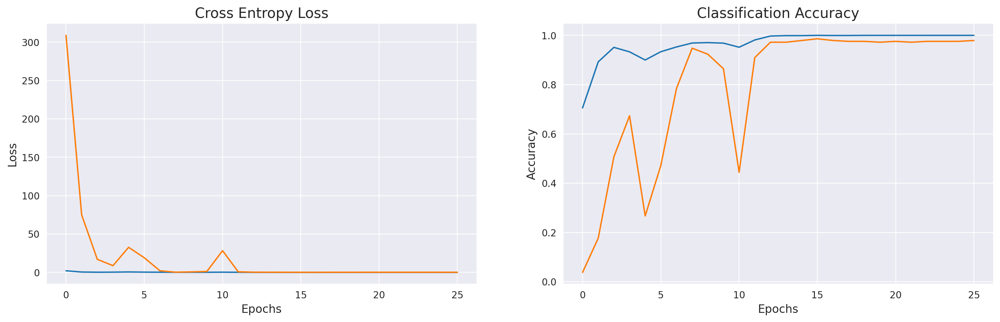

In [ ]:
error = pd.DataFrame(history_mnet.history)

plt.figure(figsize=(18,5),dpi=200)
sns.set_style('darkgrid')

plt.subplot(121)
plt.title('Cross Entropy Loss',fontsize=15)
plt.xlabel('Epochs',fontsize=12)
plt.ylabel('Loss',fontsize=12)
plt.plot(error['loss'])
plt.plot(error['val_loss'])

plt.subplot(122)
plt.title('Classification Accuracy',fontsize=15)
plt.xlabel('Epochs',fontsize=12)
plt.ylabel('Accuracy',fontsize=12)
plt.plot(error['accuracy'])
plt.plot(error['val_accuracy'])

plt.show()

In [ ]:
result = model_mnet.predict(test_generator,verbose = 0)
y_pred = np.argmax(result, axis = 1)
y_true = test_generator.labels

classes = list(train_generator.class_indices.keys())
clf_rep = classification_report(test_generator.classes, y_pred, target_names=classes, output_dict=True)

precision = [clf_rep[class_name]['precision'] for class_name in classes]
recall = [clf_rep[class_name]['recall'] for class_name in classes]
f1_score = [clf_rep[class_name]['f1-score'] for class_name in classes]

print('Classification Report')
print(classification_report(test_generator.classes, y_pred, target_names=classes))

loss,acc = model_mnet.evaluate(test_generator,verbose = 0)

print('The accuracy of the model for testing data is:',acc*100)
print('The Loss of the model for testing data is:',loss)

Classification Report
              precision    recall  f1-score   support

           0       0.90      0.75      0.82        12
           1       1.00      0.89      0.94         9
           2       1.00      1.00      1.00         8
           3       1.00      1.00      1.00        10
           4       1.00      1.00      1.00         7
           5       1.00      1.00      1.00        12
           6       1.00      1.00      1.00         7
           7       1.00      1.00      1.00         7
           8       1.00      1.00      1.00        13
           9       1.00      1.00      1.00        11
           a       1.00      1.00      1.00         9
           b       1.00      1.00      1.00        10
           c       1.00      1.00      1.00        11
           d       1.00      1.00      1.00         7
           e       1.00      1.00      1.00         7
           f       1.00      1.00      1.00         9
           g       1.00      1.00      1.00         9
     

## **MobileNetV2**

In [ ]:
mnetv2 = tf.keras.applications.MobileNetV2(
    weights = 'imagenet',
    include_top = False,
    input_shape = (224,224,3)
)
mnetv2.summary()

9406464/9406464 [==============================] - 0s 0us/step
Model: "mobilenetv2_1.00_224"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_10 (InputLayer)       [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 Conv1 (Conv2D)              (None, 112, 112, 32)         864       ['input_10[0][0]']            
                                                                                                  
 bn_Conv1 (BatchNormalizati  (None, 112, 112, 32)         128       ['Conv1[0][0]']               
 on)                                                                                              
                                                                                                  
 Conv1_relu (ReL

In [ ]:
model_mnetv2 = Sequential([
    mnetv2,
    BatchNormalization(),
    Flatten(),
    Dense(256, activation='relu'),
    Dense(36, activation='softmax')
])
model_mnetv2.compile(optimizer = Adam(learning_rate=0.001), loss='categorical_crossentropy', metrics=['accuracy'])

In [ ]:
history_mnetv2 = model_mnetv2.fit(
    train_generator,
    epochs=EPOCHS,
    validation_data=validation_generator,
    validation_steps=total_validate // BATCH_SIZE,
    steps_per_epoch=total_train // BATCH_SIZE,
    callbacks=[learning_rate_reduction, early_stop],
)

Epoch 1/50
59/59 [==============================] - 41s 219ms/step - loss: 1.8458 - accuracy: 0.7128 - val_loss: 764.8800 - val_accuracy: 0.0451 - lr: 0.0010
Epoch 2/50
59/59 [==============================] - 10s 173ms/step - loss: 0.5346 - accuracy: 0.8578 - val_loss: 531.5123 - val_accuracy: 0.0417 - lr: 0.0010
Epoch 3/50
59/59 [==============================] - 9s 154ms/step - loss: 0.6893 - accuracy: 0.8594 - val_loss: 433.3812 - val_accuracy: 0.0451 - lr: 0.0010
Epoch 4/50
59/59 [==============================] - 10s 171ms/step - loss: 0.5724 - accuracy: 0.8930 - val_loss: 393.6570 - val_accuracy: 0.0556 - lr: 0.0010
Epoch 5/50
59/59 [==============================] - 10s 172ms/step - loss: 0.2523 - accuracy: 0.9390 - val_loss: 410.6588 - val_accuracy: 0.0590 - lr: 0.0010
Epoch 6/50
59/59 [==============================] - 9s 152ms/step - loss: 0.3161 - accuracy: 0.9246 - val_loss: 233.1599 - val_accuracy: 0.0417 - lr: 0.0010
Epoch 7/50
59/59 [==============================] - 10

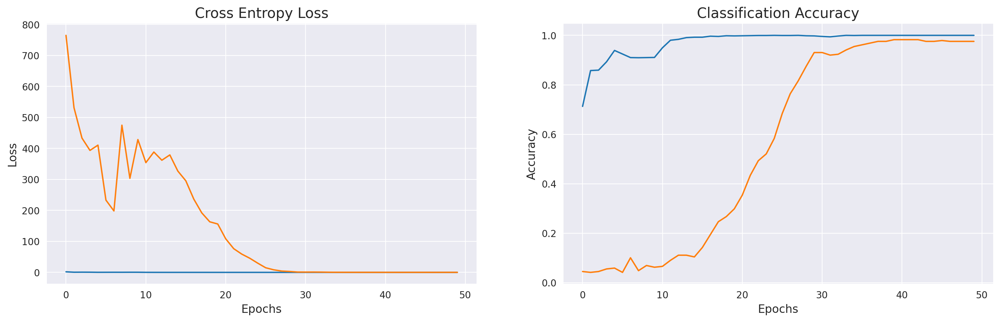

In [ ]:
error = pd.DataFrame(history_mnetv2.history)

plt.figure(figsize=(18,5),dpi=200)
sns.set_style('darkgrid')

plt.subplot(121)
plt.title('Cross Entropy Loss',fontsize=15)
plt.xlabel('Epochs',fontsize=12)
plt.ylabel('Loss',fontsize=12)
plt.plot(error['loss'])
plt.plot(error['val_loss'])

plt.subplot(122)
plt.title('Classification Accuracy',fontsize=15)
plt.xlabel('Epochs',fontsize=12)
plt.ylabel('Accuracy',fontsize=12)
plt.plot(error['accuracy'])
plt.plot(error['val_accuracy'])

plt.show()

In [ ]:
result = model_mnetv2.predict(test_generator,verbose = 0)
y_pred = np.argmax(result, axis = 1)
y_true = test_generator.labels

classes = list(train_generator.class_indices.keys())
clf_rep = classification_report(test_generator.classes, y_pred, target_names=classes, output_dict=True)

precision = [clf_rep[class_name]['precision'] for class_name in classes]
recall = [clf_rep[class_name]['recall'] for class_name in classes]
f1_score = [clf_rep[class_name]['f1-score'] for class_name in classes]

print('Classification Report')
print(classification_report(test_generator.classes, y_pred, target_names=classes))

loss,acc = model_mnetv2.evaluate(test_generator,verbose = 0)

print('The accuracy of the model for testing data is:',acc*100)
print('The Loss of the model for testing data is:',loss)

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.83      0.91        12
           1       0.90      1.00      0.95         9
           2       1.00      1.00      1.00         8
           3       1.00      1.00      1.00        10
           4       1.00      1.00      1.00         7
           5       1.00      1.00      1.00        12
           6       0.88      1.00      0.93         7
           7       1.00      1.00      1.00         7
           8       1.00      1.00      1.00        13
           9       1.00      1.00      1.00        11
           a       1.00      1.00      1.00         9
           b       1.00      1.00      1.00        10
           c       1.00      1.00      1.00        11
           d       1.00      1.00      1.00         7
           e       1.00      1.00      1.00         7
           f       1.00      1.00      1.00         9
           g       1.00      1.00      1.00         9
     

## **Prediction**

In [ ]:
class_map = train_generator.class_indices
classes = []
for key in class_map.keys():
    classes.append(key)

In [ ]:
def predict_image(filename, model):
    img_ = image.load_img(filename, target_size=(224, 224))
    img_array = image.img_to_array(img_)
    img_processed = np.expand_dims(img_array, axis=0)
    img_processed /= 255.

    prediction = model.predict(img_processed)

    index = np.argmax(prediction)

    plt.title("Prediction - {}".format(str(classes[index]).title()), size=18, color='red')
    plt.imshow(img_array)

# **SqueezeNet**

In [ ]:
model = squeezenet_model

1/1 [==============================] - 0s 471ms/step


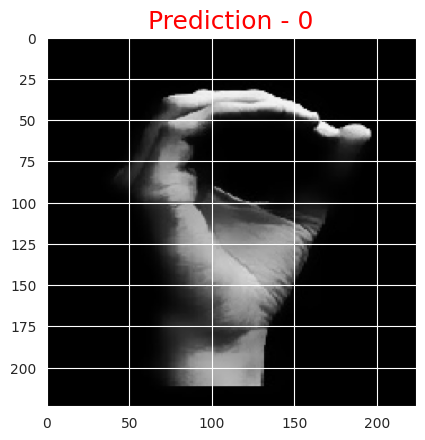

In [ ]:
pred_0 = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/bilateral/hand_0_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 21ms/step


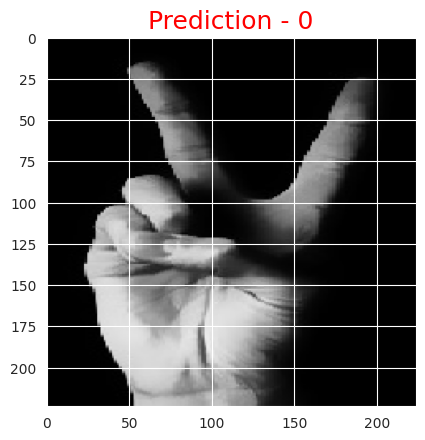

In [ ]:
pred_2 = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/bilateral/hand_2_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 24ms/step


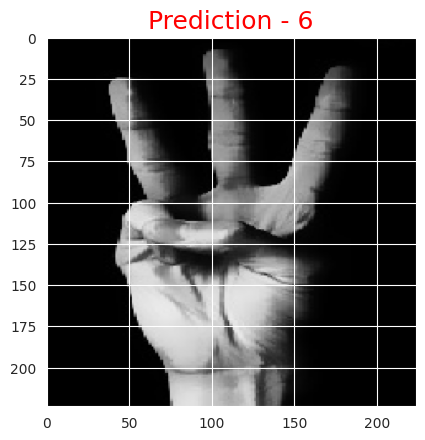

In [ ]:
pred_6 = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/bilateral/hand_6_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 25ms/step


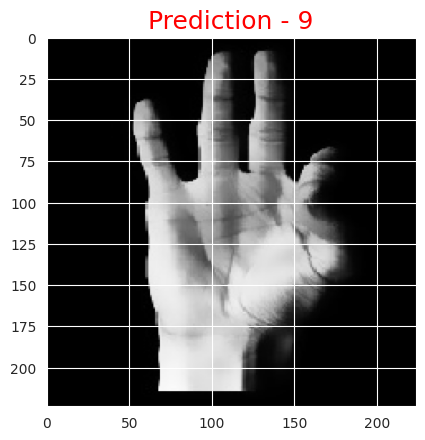

In [ ]:
pred_9 = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/bilateral/hand_9_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 20ms/step


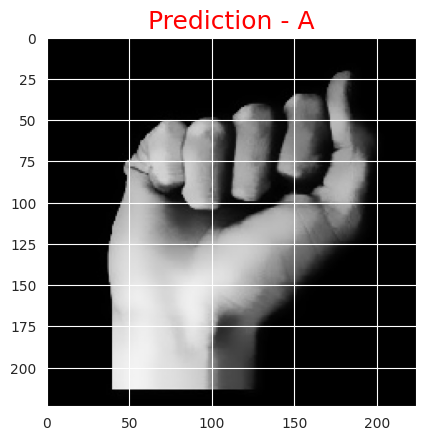

In [ ]:
pred_a = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/bilateral/hand_a_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 21ms/step


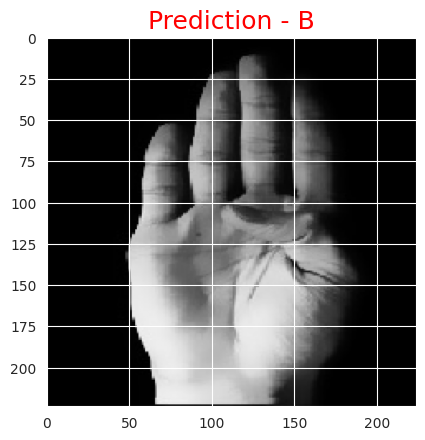

In [ ]:
pred_b = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/bilateral/hand_b_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 22ms/step


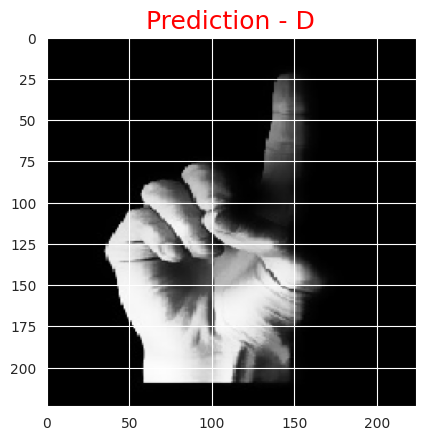

In [ ]:
pred_d = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/bilateral/hand_d_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 22ms/step


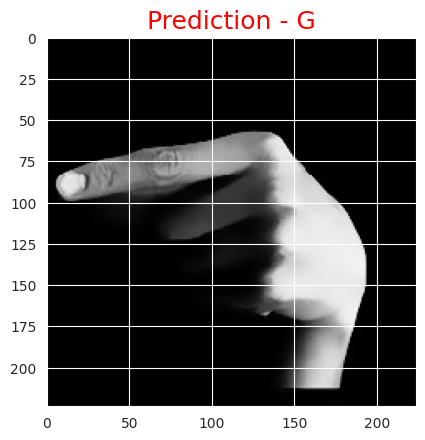

In [ ]:
pred_g = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/bilateral/hand_g_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 22ms/step


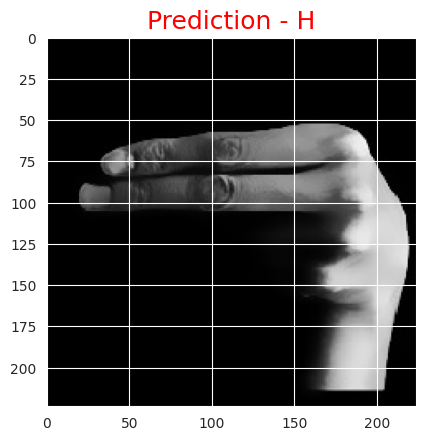

In [ ]:
pred_h = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/bilateral/hand_h_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 32ms/step


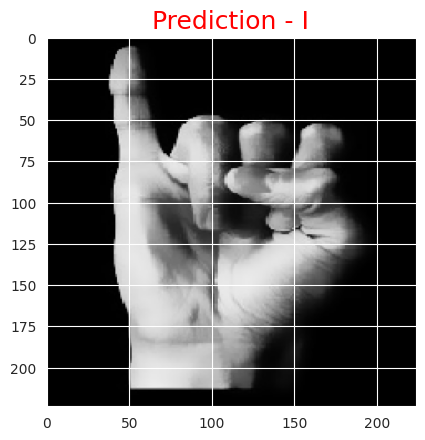

In [ ]:
pred_i = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/bilateral/hand_i_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 33ms/step


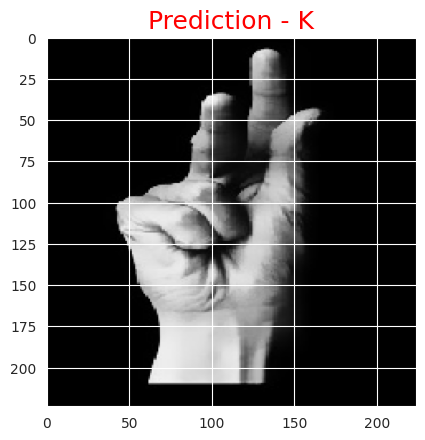

In [ ]:
pred_k = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/bilateral/hand_k_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 35ms/step


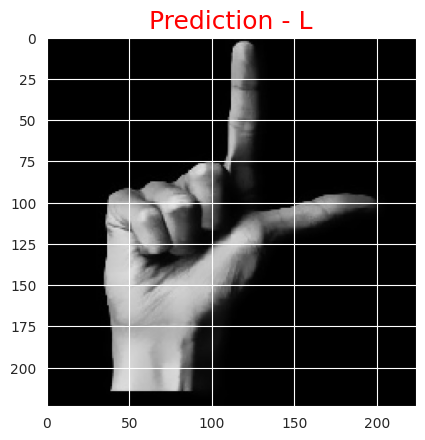

In [ ]:
pred_l = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/bilateral/hand_l_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 36ms/step


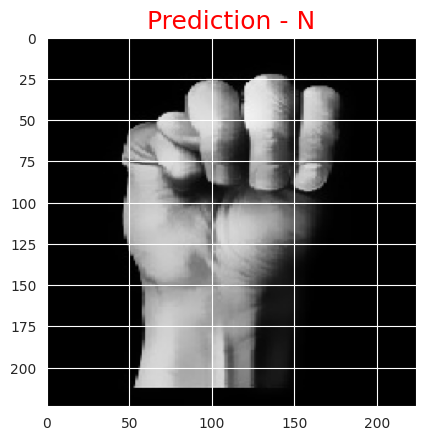

In [ ]:
pred_m = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/bilateral/hand_m_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 35ms/step


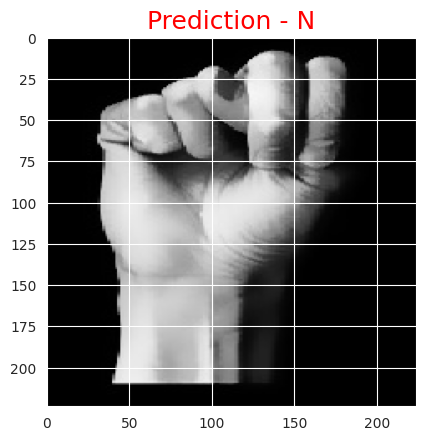

In [ ]:
pred_n = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/bilateral/hand_n_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 21ms/step


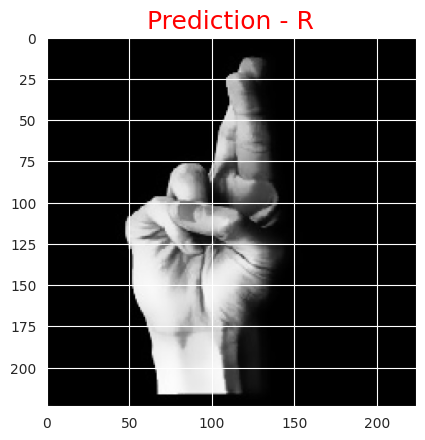

In [ ]:
pred_r = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/bilateral/hand_r_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 22ms/step


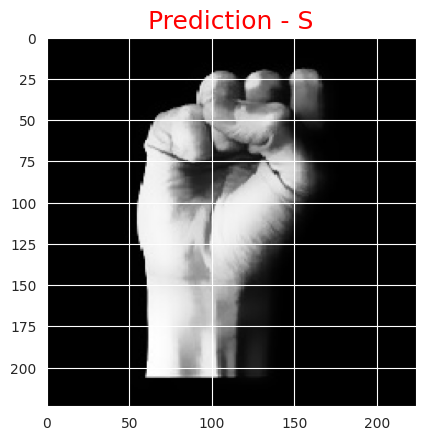

In [ ]:
pred_s = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/bilateral/hand_s_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 21ms/step


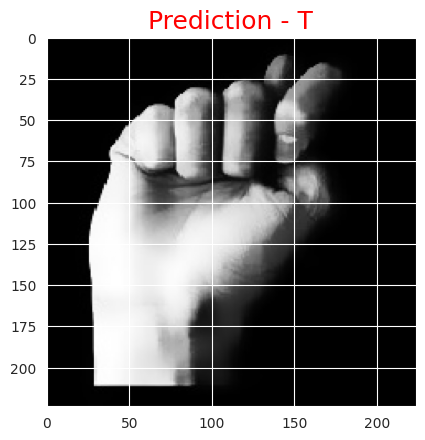

In [ ]:
pred_t = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/bilateral/hand_t_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 21ms/step


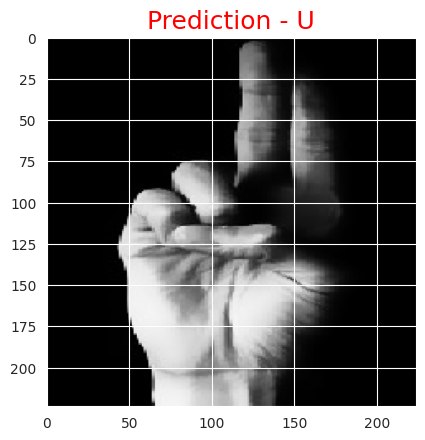

In [ ]:
pred_u = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/bilateral/hand_u_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 21ms/step


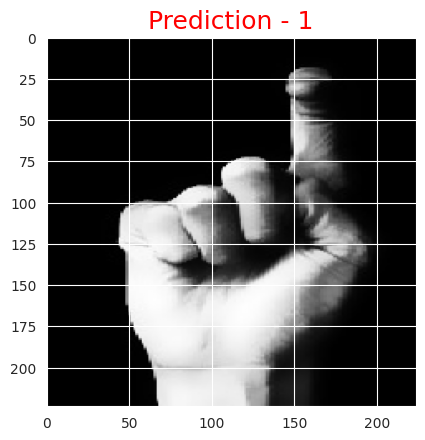

In [ ]:
pred_x = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/bilateral/hand_x_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 23ms/step


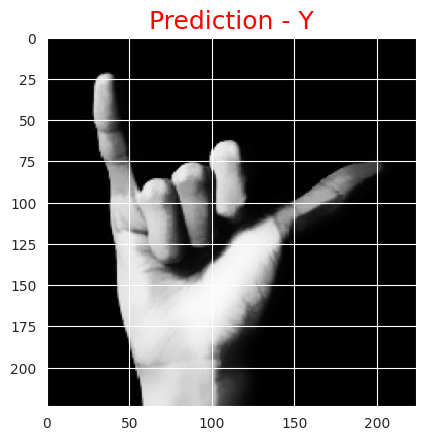

In [ ]:
pred_y = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/bilateral/hand_y_seg_1_cropped.jpeg', model)

# **InceptionV3**

In [ ]:
model = inception_model

1/1 [==============================] - 1s 1s/step


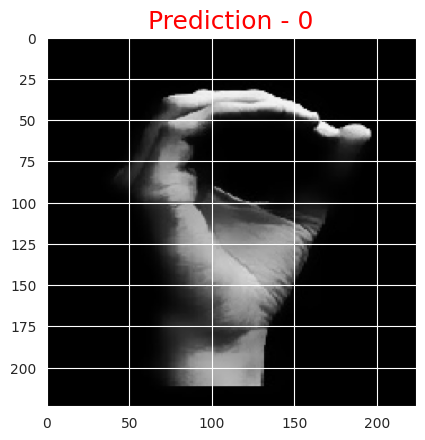

In [ ]:
pred_0 = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/bilateral/hand_0_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 27ms/step


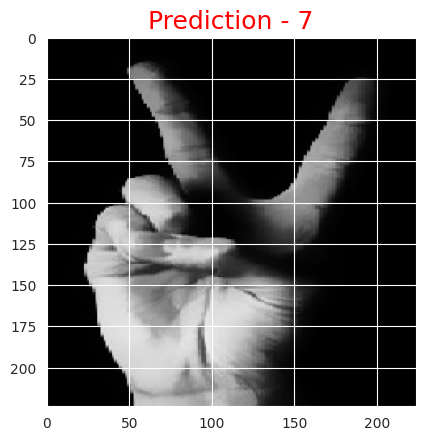

In [ ]:
pred_2 = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/bilateral/hand_2_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 27ms/step


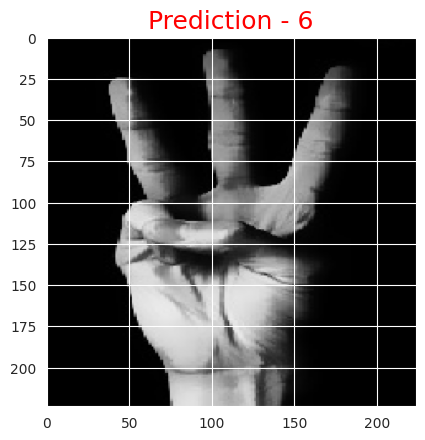

In [ ]:
pred_6 = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/bilateral/hand_6_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 28ms/step


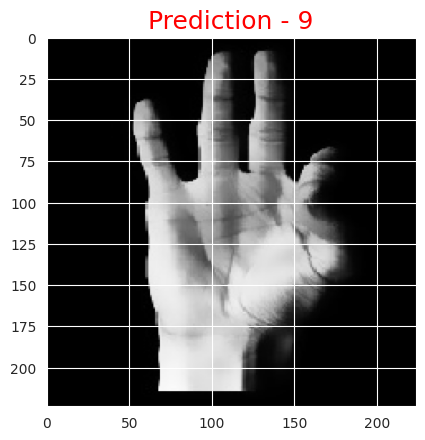

In [ ]:
pred_9 = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/bilateral/hand_9_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 25ms/step


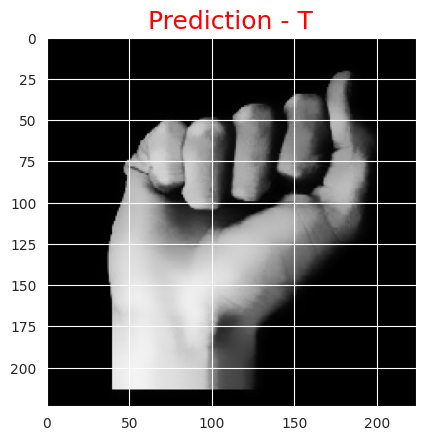

In [ ]:
pred_a = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/bilateral/hand_a_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 27ms/step


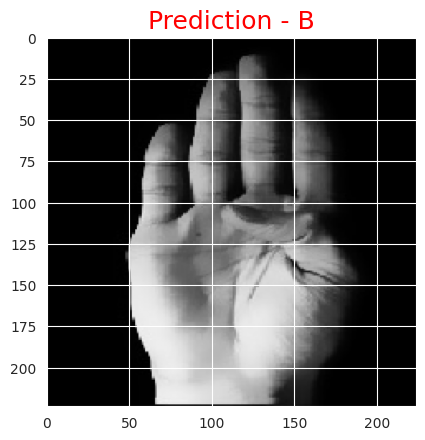

In [ ]:
pred_b = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/bilateral/hand_b_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 26ms/step


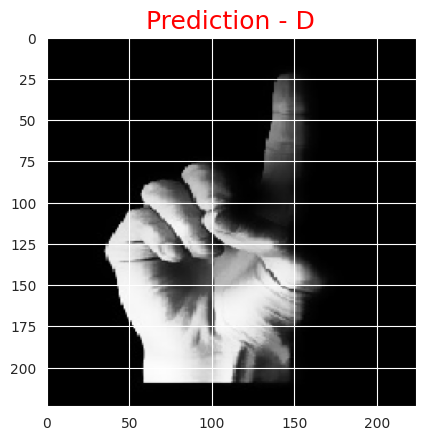

In [ ]:
pred_d = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/bilateral/hand_d_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 25ms/step


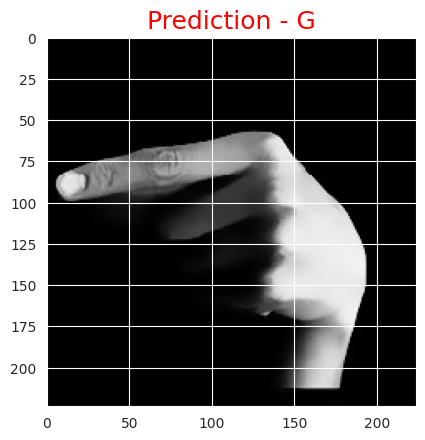

In [ ]:
pred_g = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/bilateral/hand_g_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 27ms/step


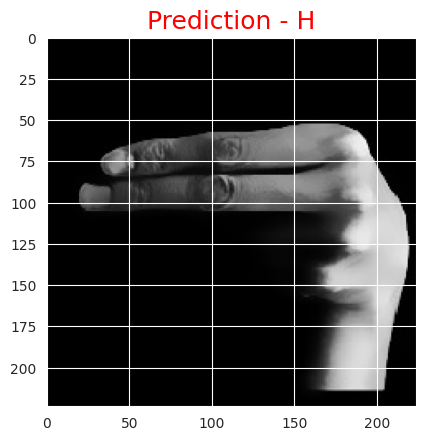

In [ ]:
pred_h = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/bilateral/hand_h_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 27ms/step


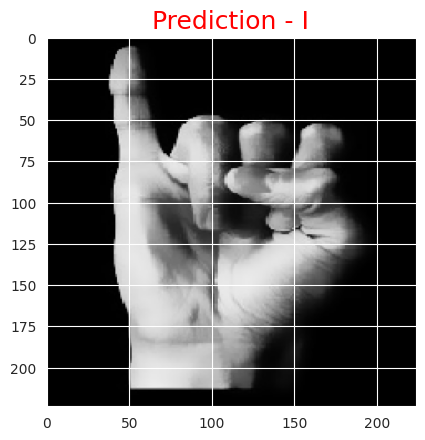

In [ ]:
pred_i = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/bilateral/hand_i_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 41ms/step


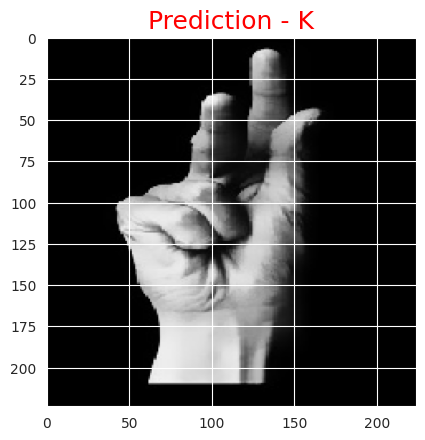

In [ ]:
pred_k = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/bilateral/hand_k_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 38ms/step


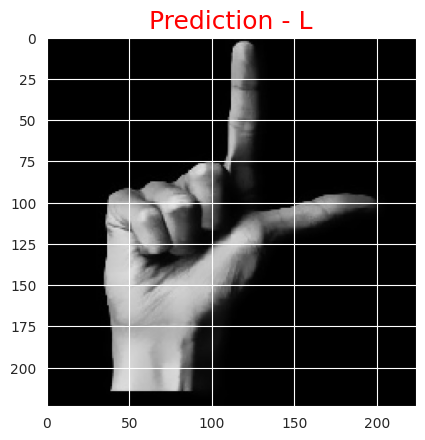

In [ ]:
pred_l = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/bilateral/hand_l_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 38ms/step


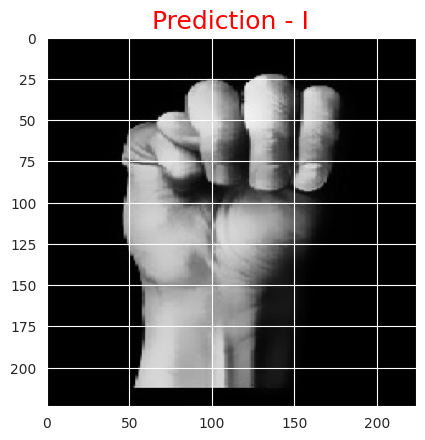

In [ ]:
pred_m = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/bilateral/hand_m_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 42ms/step


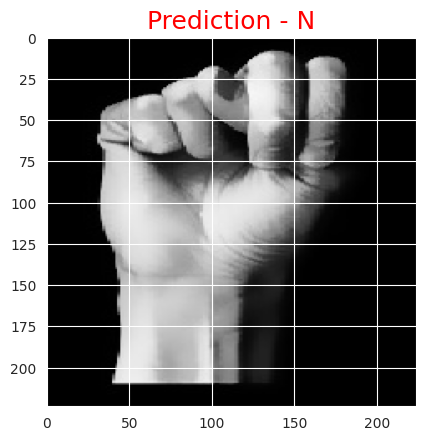

In [ ]:
pred_n = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/bilateral/hand_n_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 56ms/step


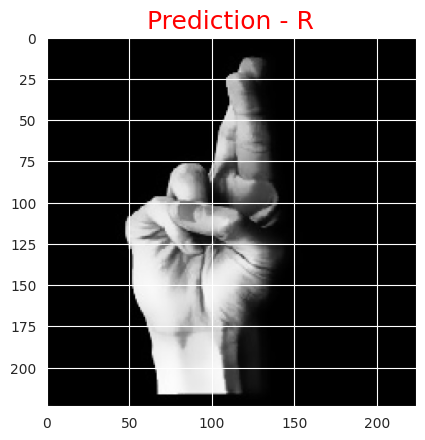

In [ ]:
pred_r = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/bilateral/hand_r_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 56ms/step


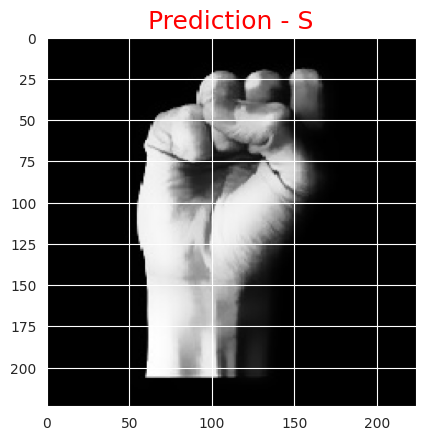

In [ ]:
pred_s = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/bilateral/hand_s_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 48ms/step


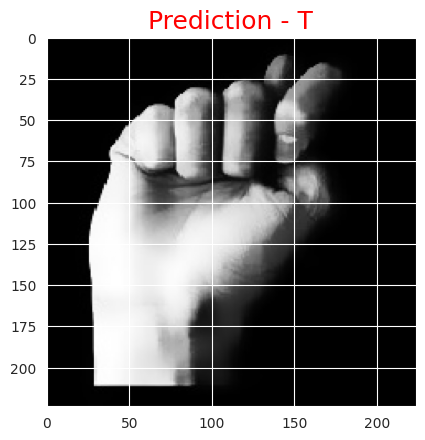

In [ ]:
pred_t = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/bilateral/hand_t_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 66ms/step


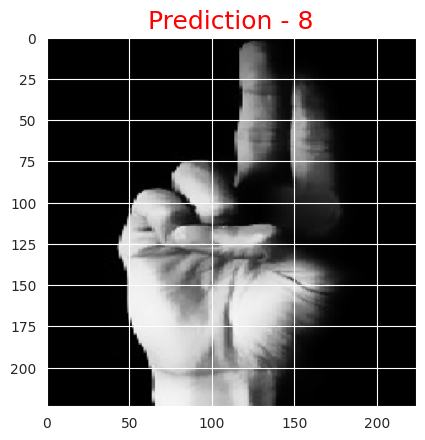

In [ ]:
pred_u = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/bilateral/hand_u_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 52ms/step


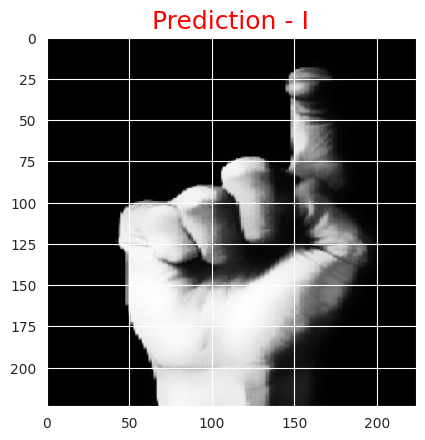

In [ ]:
pred_x = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/bilateral/hand_x_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 61ms/step


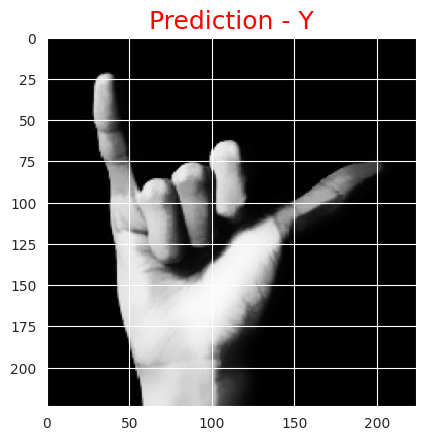

In [ ]:
pred_y = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/bilateral/hand_y_seg_1_cropped.jpeg', model)

# **Xception**

In [ ]:
model = xception_model

1/1 [==============================] - 1s 779ms/step


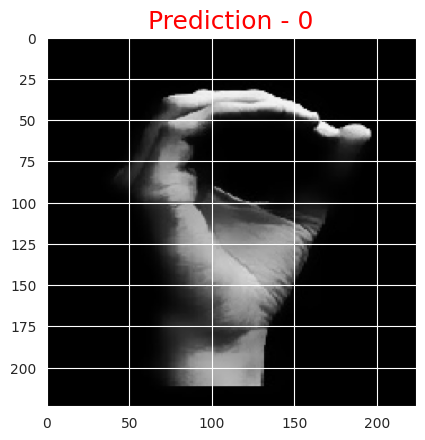

In [ ]:
pred_0 = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/bilateral/hand_0_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 25ms/step


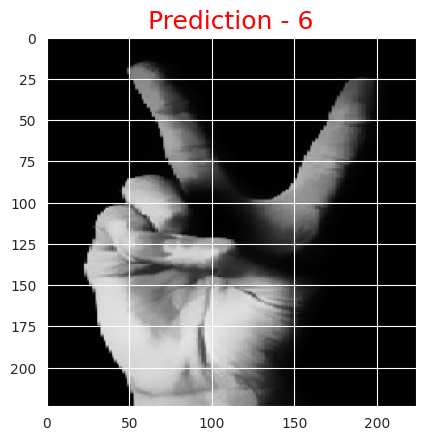

In [ ]:
pred_2 = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/bilateral/hand_2_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 21ms/step


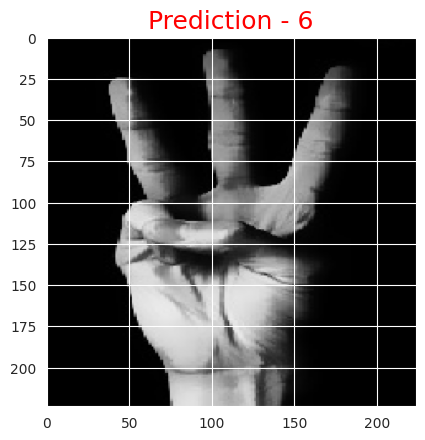

In [ ]:
pred_6 = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/bilateral/hand_6_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 23ms/step


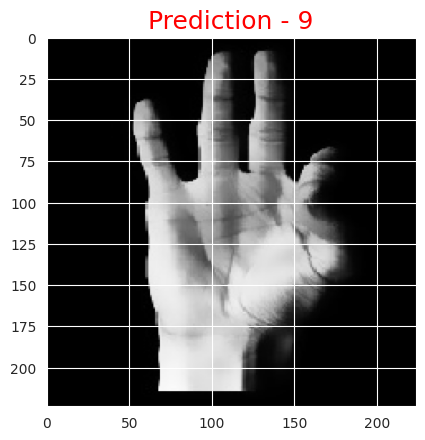

In [ ]:
pred_9 = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/bilateral/hand_9_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 23ms/step


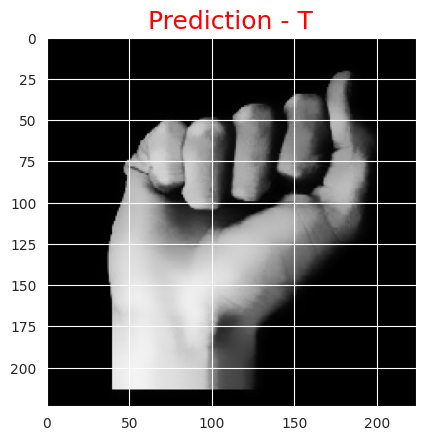

In [ ]:
pred_a = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/bilateral/hand_a_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 22ms/step


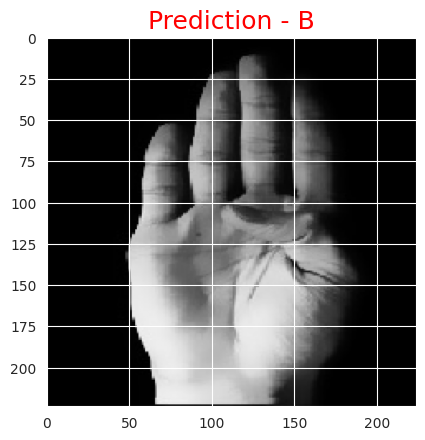

In [ ]:
pred_b = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/bilateral/hand_b_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 26ms/step


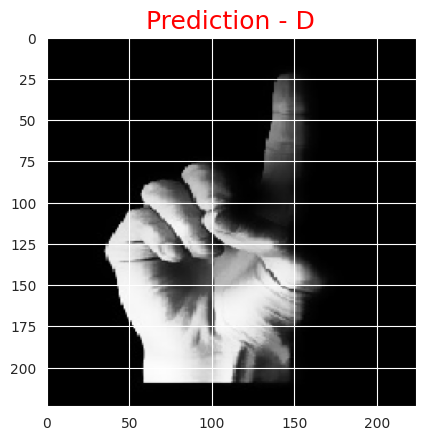

In [ ]:
pred_d = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/bilateral/hand_d_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 23ms/step


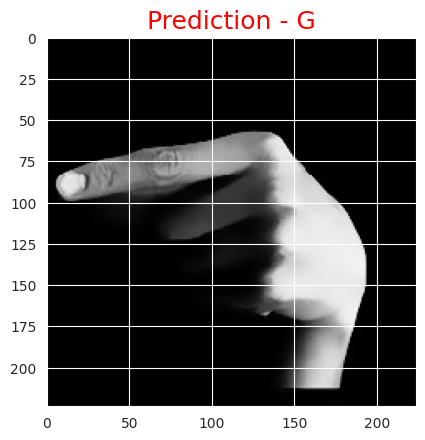

In [ ]:
pred_g = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/bilateral/hand_g_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 25ms/step


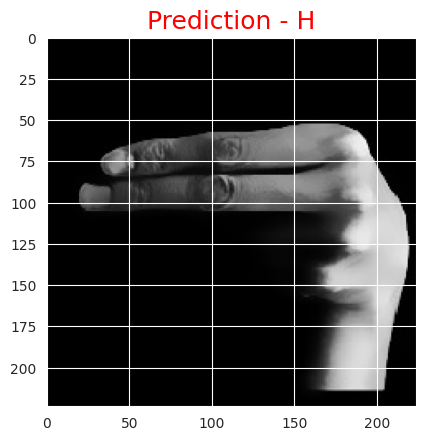

In [ ]:
pred_h = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/bilateral/hand_h_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 23ms/step


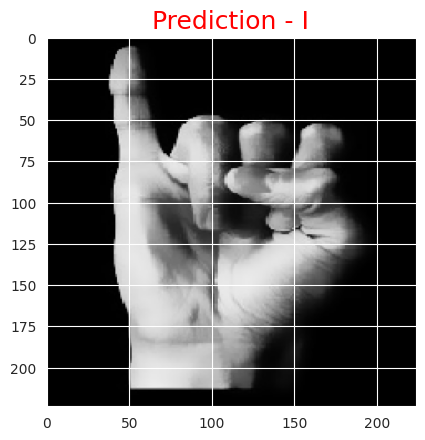

In [ ]:
pred_i = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/bilateral/hand_i_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 24ms/step


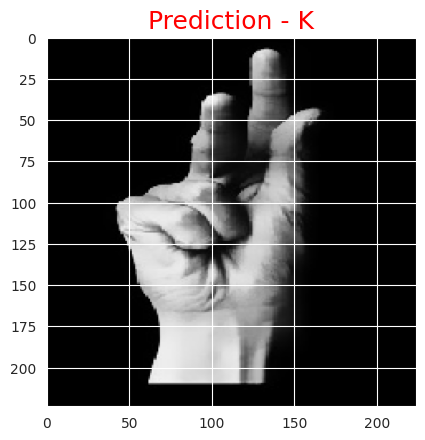

In [ ]:
pred_k = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/bilateral/hand_k_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 21ms/step


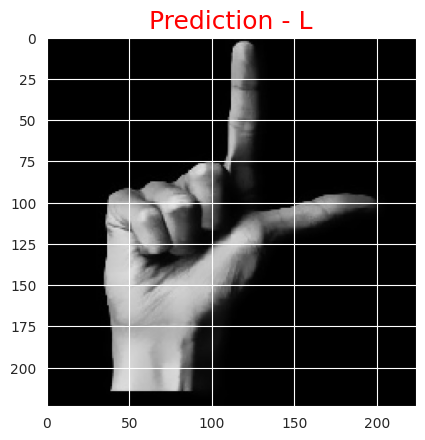

In [ ]:
pred_l = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/bilateral/hand_l_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 24ms/step


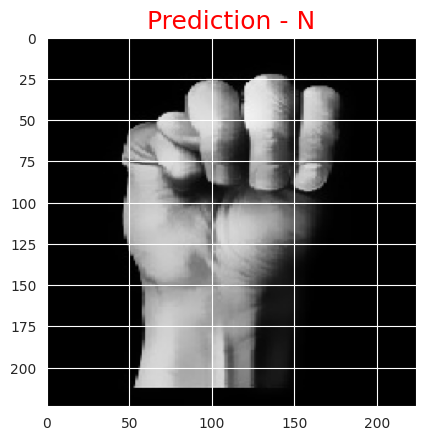

In [ ]:
pred_m = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/bilateral/hand_m_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 23ms/step


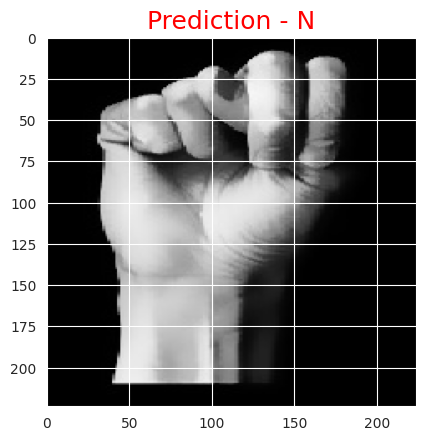

In [ ]:
pred_n = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/bilateral/hand_n_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 22ms/step


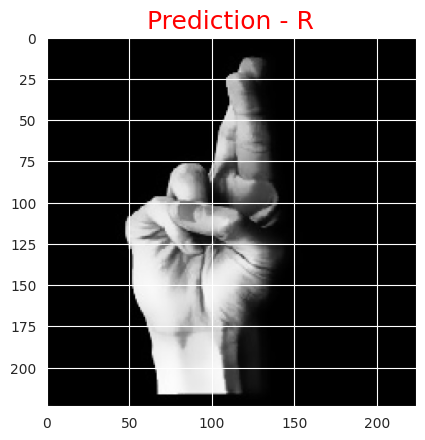

In [ ]:
pred_r = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/bilateral/hand_r_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 56ms/step


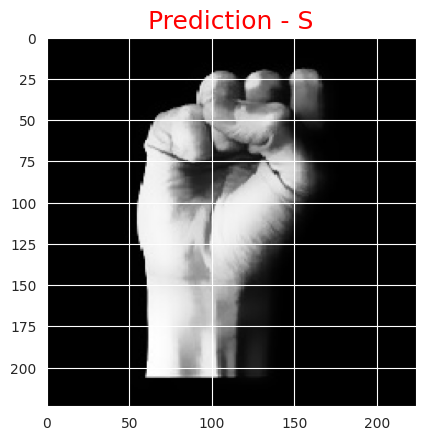

In [ ]:
pred_s = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/bilateral/hand_s_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 37ms/step


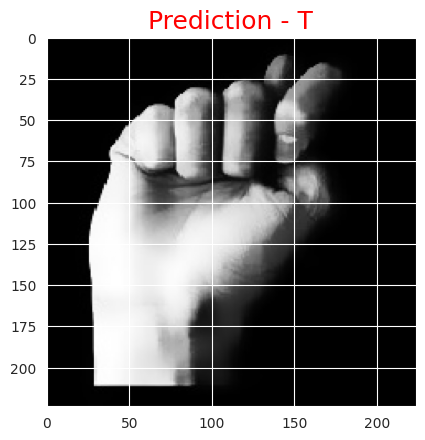

In [ ]:
pred_t = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/bilateral/hand_t_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 25ms/step


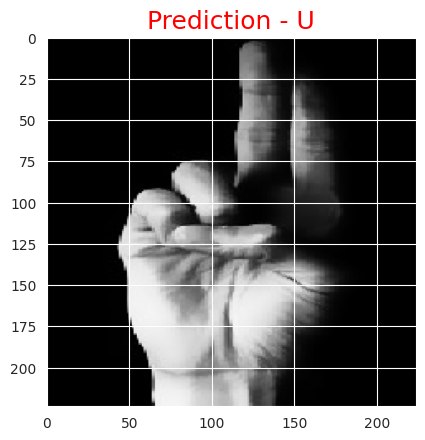

In [ ]:
pred_u = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/bilateral/hand_u_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 27ms/step


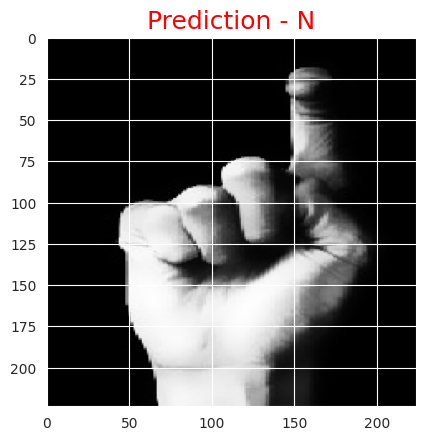

In [ ]:
pred_x = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/bilateral/hand_x_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 37ms/step


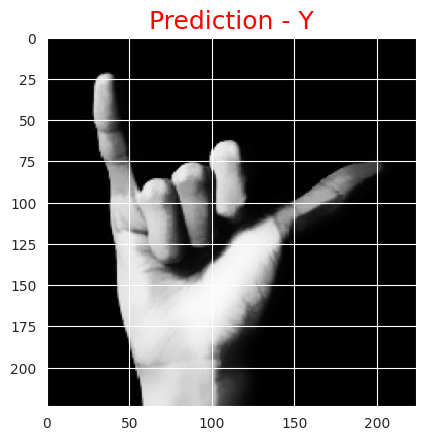

In [ ]:
pred_y = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/bilateral/hand_y_seg_1_cropped.jpeg', model)

# **VGG16**

In [ ]:
model = vgg16_model

1/1 [==============================] - 0s 215ms/step


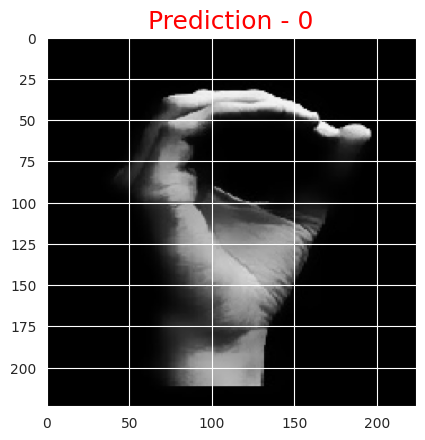

In [ ]:
pred_0 = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/bilateral/hand_0_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 29ms/step


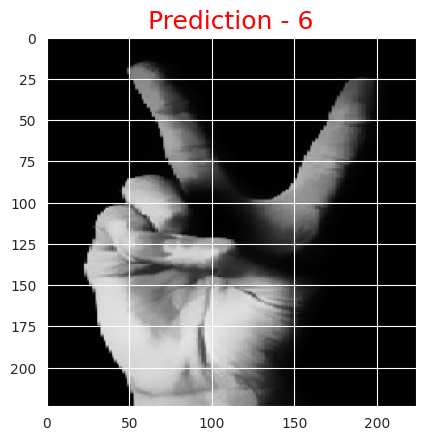

In [ ]:
pred_2 = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/bilateral/hand_2_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 29ms/step


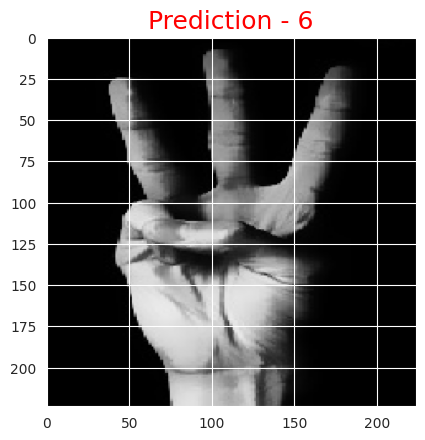

In [ ]:
pred_6 = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/bilateral/hand_6_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 27ms/step


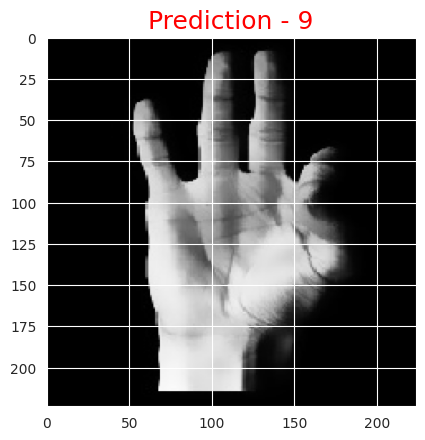

In [ ]:
pred_9 = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/bilateral/hand_9_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 44ms/step


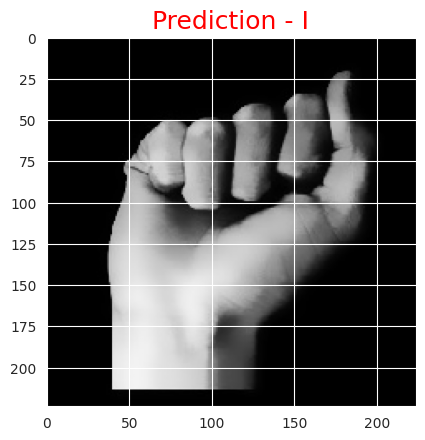

In [ ]:
pred_a = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/bilateral/hand_a_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 47ms/step


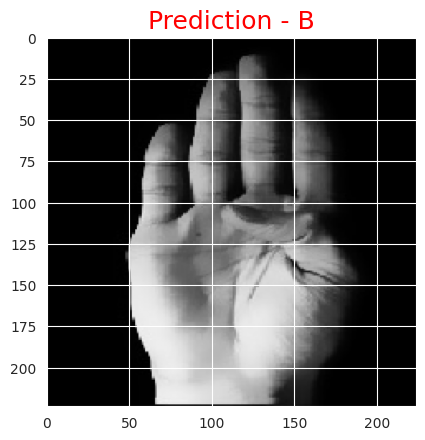

In [ ]:
pred_b = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/bilateral/hand_b_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 27ms/step


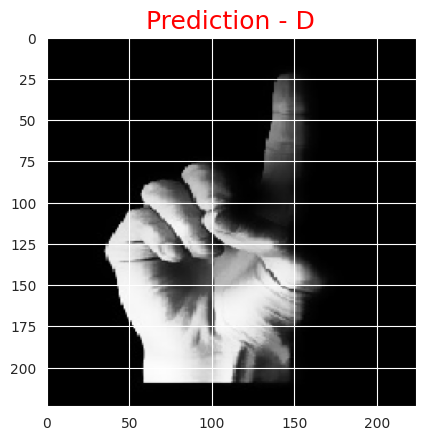

In [ ]:
pred_d = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/bilateral/hand_d_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 31ms/step


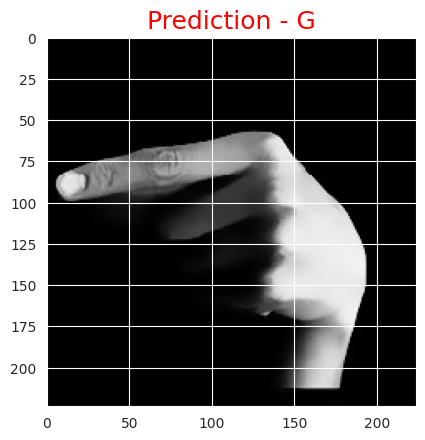

In [ ]:
pred_g = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/bilateral/hand_g_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 18ms/step


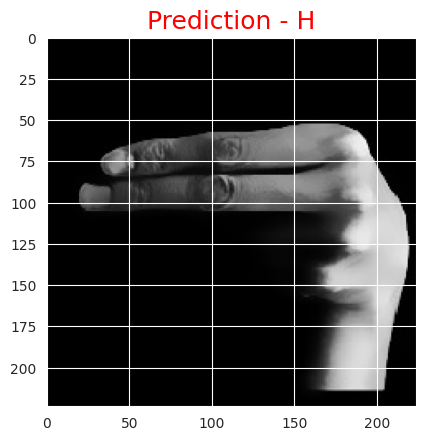

In [ ]:
pred_h = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/bilateral/hand_h_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 20ms/step


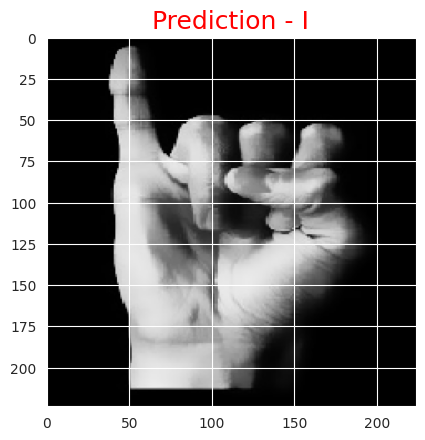

In [ ]:
pred_i = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/bilateral/hand_i_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 19ms/step


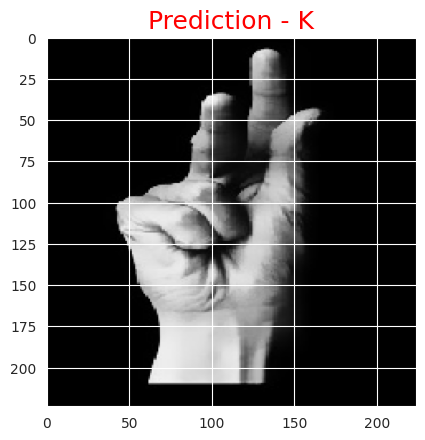

In [ ]:
pred_k = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/bilateral/hand_k_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 19ms/step


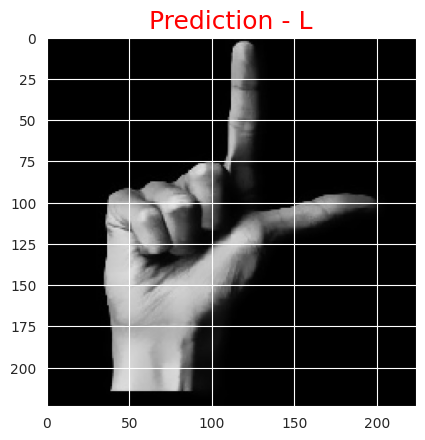

In [ ]:
pred_l = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/bilateral/hand_l_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 19ms/step


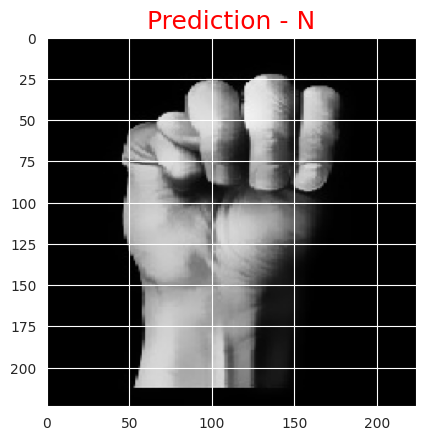

In [ ]:
pred_m = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/bilateral/hand_m_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 20ms/step


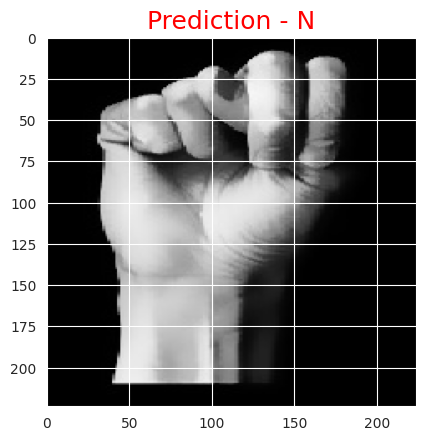

In [ ]:
pred_n = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/bilateral/hand_n_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 19ms/step


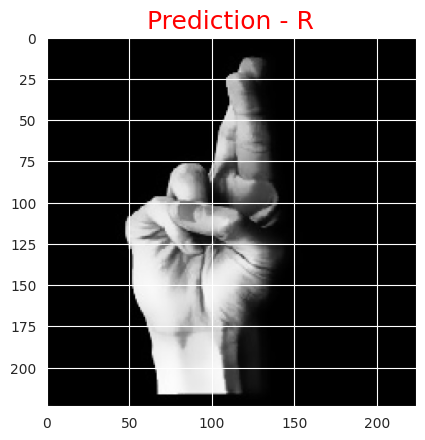

In [ ]:
pred_r = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/bilateral/hand_r_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 19ms/step


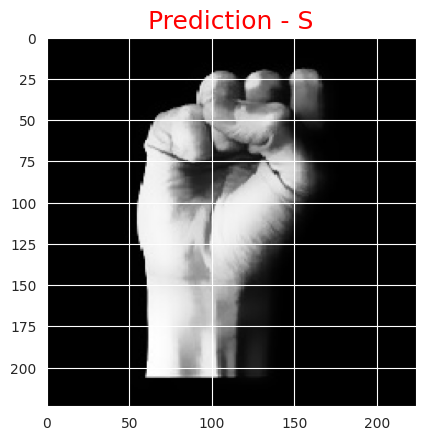

In [ ]:
pred_s = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/bilateral/hand_s_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 23ms/step


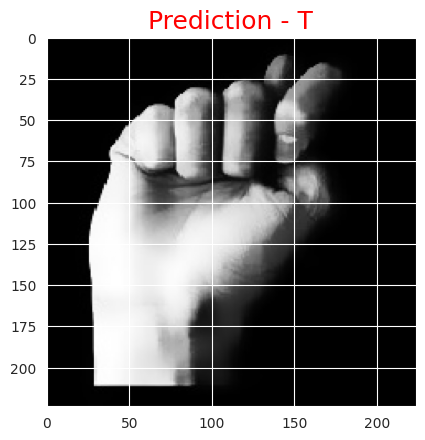

In [ ]:
pred_t = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/bilateral/hand_t_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 28ms/step


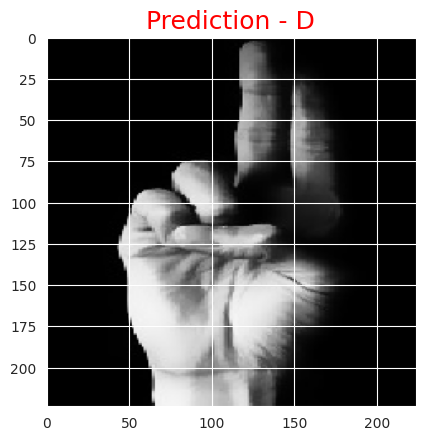

In [ ]:
pred_u = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/bilateral/hand_u_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 28ms/step


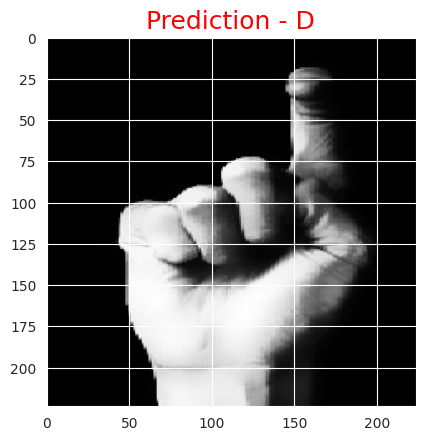

In [ ]:
pred_x = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/bilateral/hand_x_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 20ms/step


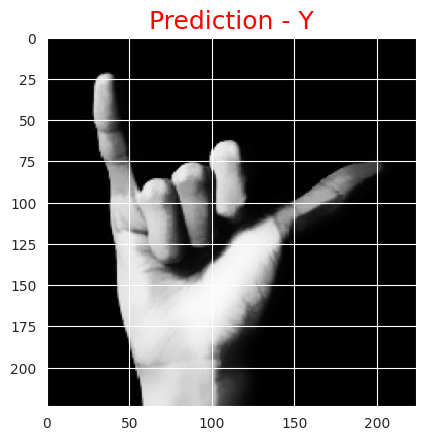

In [ ]:
pred_y = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/bilateral/hand_y_seg_1_cropped.jpeg', model)

# **VGG19**

In [ ]:
model = vgg19_model

1/1 [==============================] - 0s 249ms/step


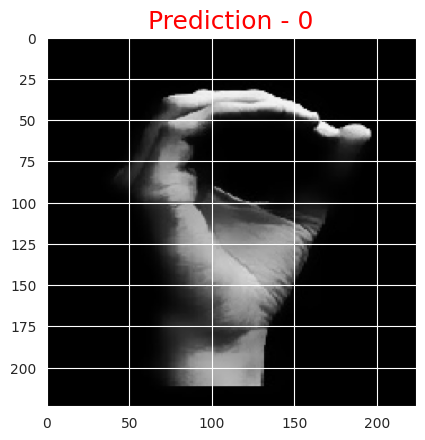

In [ ]:
pred_0 = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/bilateral/hand_0_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 19ms/step


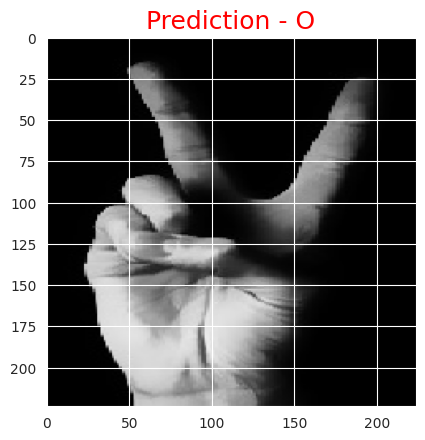

In [ ]:
pred_2 = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/bilateral/hand_2_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 19ms/step


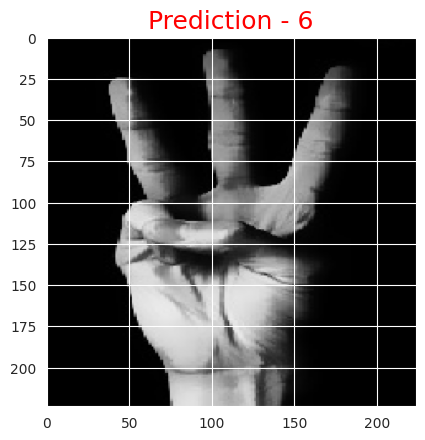

In [ ]:
pred_6 = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/bilateral/hand_6_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 20ms/step


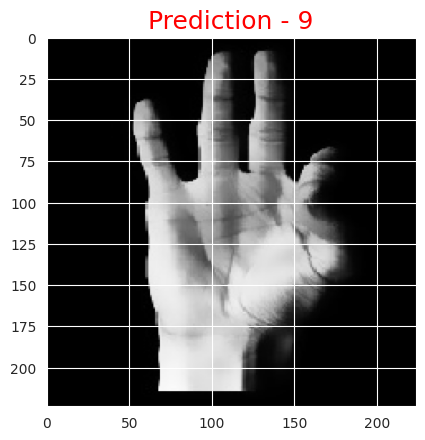

In [ ]:
pred_9 = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/bilateral/hand_9_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 20ms/step


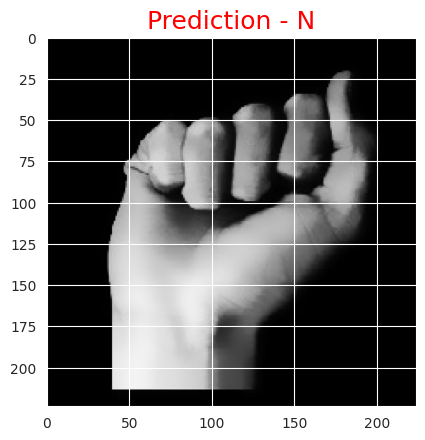

In [ ]:
pred_a = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/bilateral/hand_a_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 19ms/step


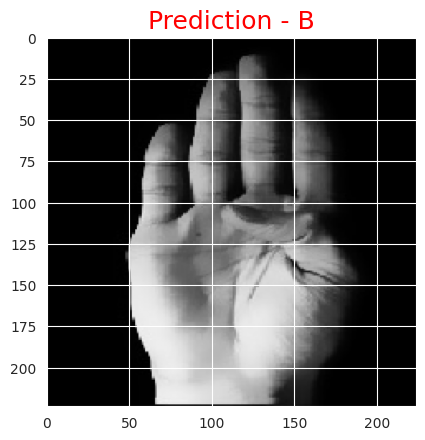

In [ ]:
pred_b = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/bilateral/hand_b_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 21ms/step


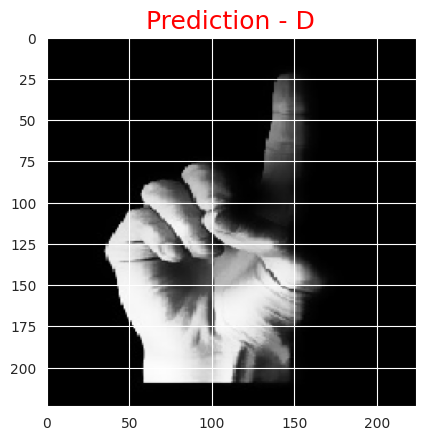

In [ ]:
pred_d = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/bilateral/hand_d_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 22ms/step


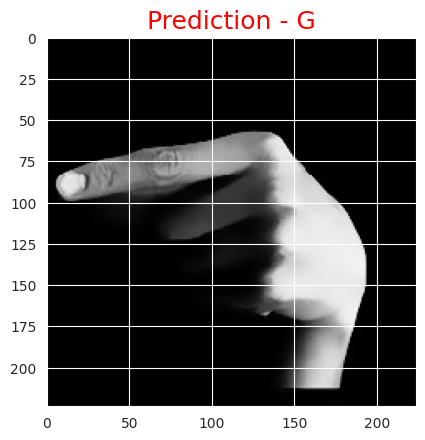

In [ ]:
pred_g = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/bilateral/hand_g_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 19ms/step


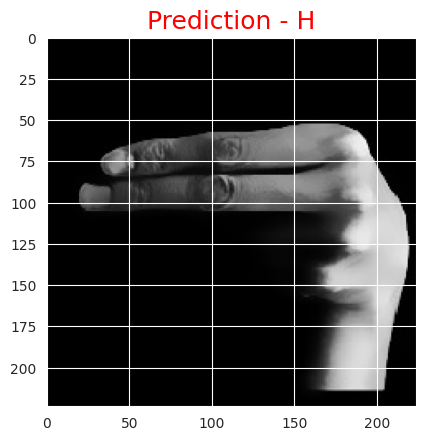

In [ ]:
pred_h = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/bilateral/hand_h_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 29ms/step


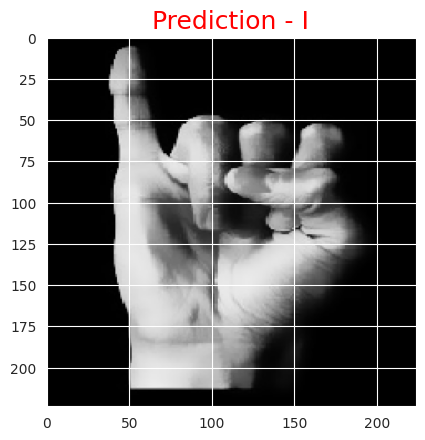

In [ ]:
pred_i = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/bilateral/hand_i_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 19ms/step


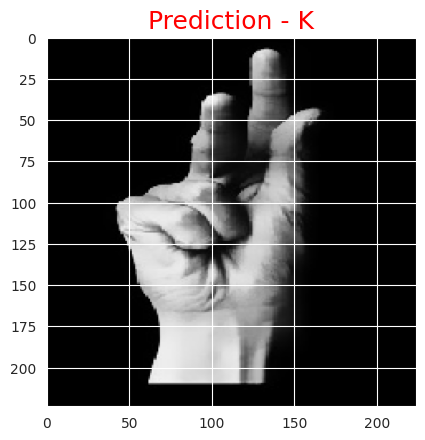

In [ ]:
pred_k = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/bilateral/hand_k_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 21ms/step


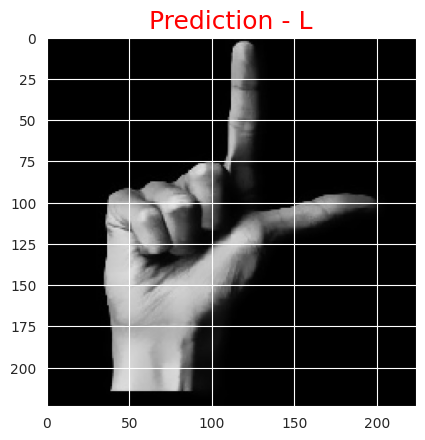

In [ ]:
pred_l = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/bilateral/hand_l_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 20ms/step


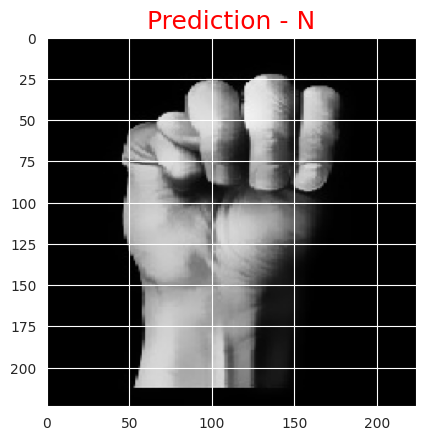

In [ ]:
pred_m = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/bilateral/hand_m_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 19ms/step


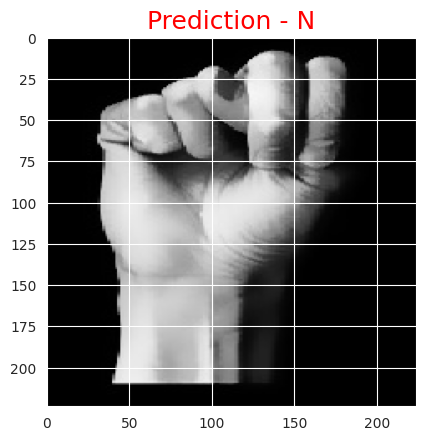

In [ ]:
pred_n = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/bilateral/hand_n_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 25ms/step


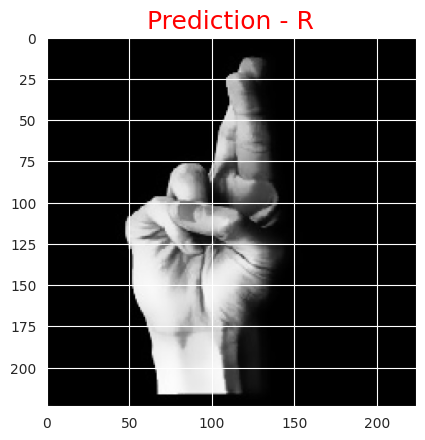

In [ ]:
pred_r = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/bilateral/hand_r_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 20ms/step


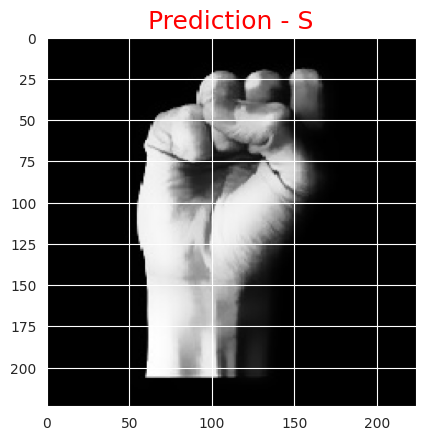

In [ ]:
pred_s = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/bilateral/hand_s_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 29ms/step


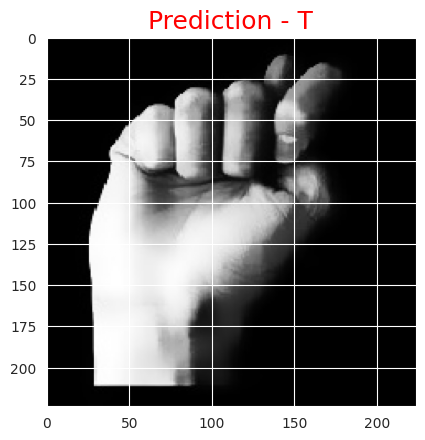

In [ ]:
pred_t = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/bilateral/hand_t_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 26ms/step


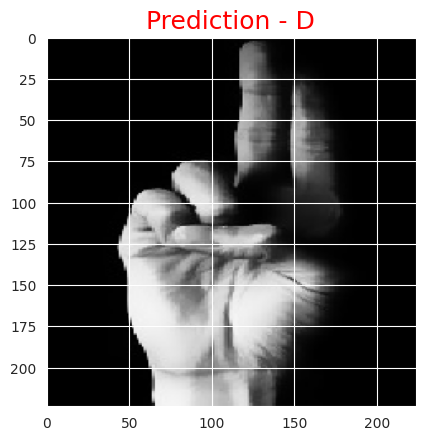

In [ ]:
pred_u = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/bilateral/hand_u_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 27ms/step


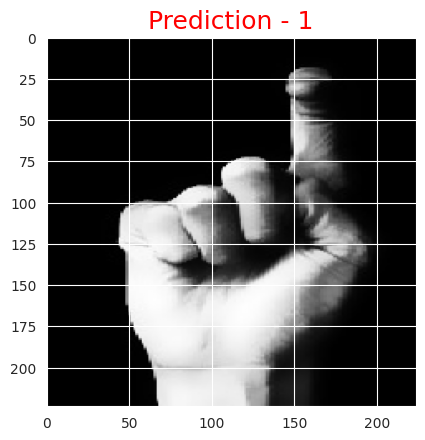

In [ ]:
pred_x = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/bilateral/hand_x_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 32ms/step


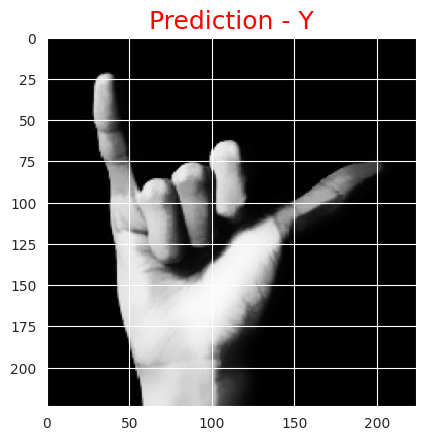

In [ ]:
pred_y = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/bilateral/hand_y_seg_1_cropped.jpeg', model)

# **ResNet50**

In [ ]:
model = model_50

1/1 [==============================] - 1s 925ms/step


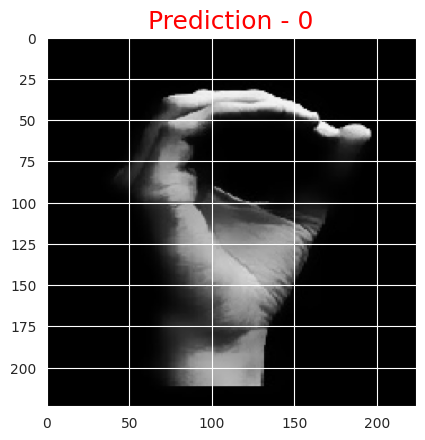

In [ ]:
pred_0 = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/bilateral/hand_0_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 25ms/step


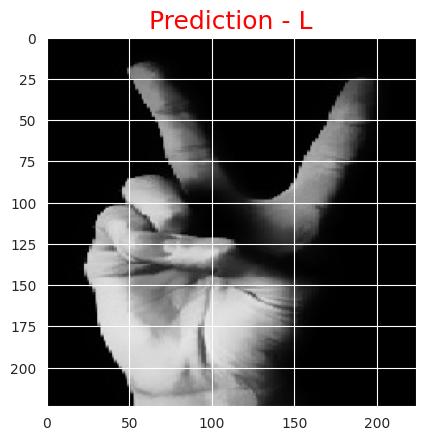

In [ ]:
pred_2 = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/bilateral/hand_2_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 24ms/step


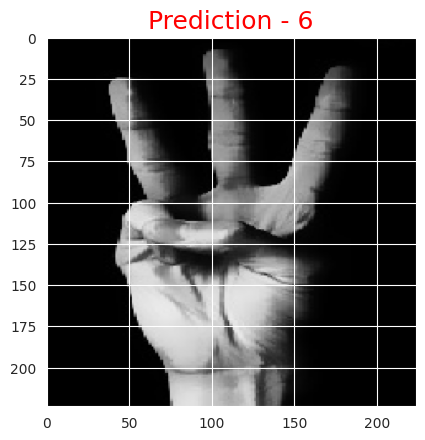

In [ ]:
pred_6 = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/bilateral/hand_6_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 27ms/step


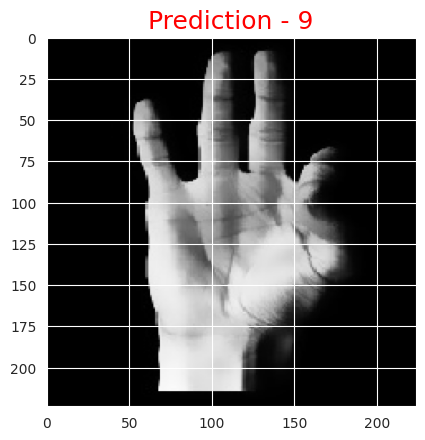

In [ ]:
pred_9 = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/bilateral/hand_9_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 27ms/step


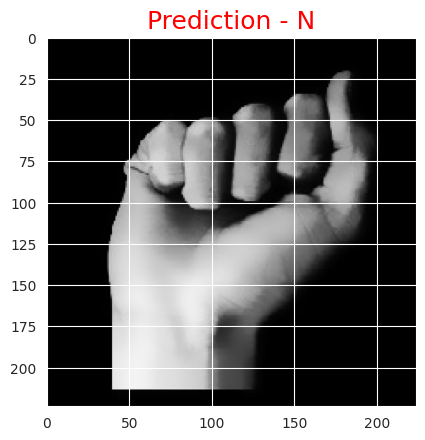

In [ ]:
pred_a = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/bilateral/hand_a_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 23ms/step


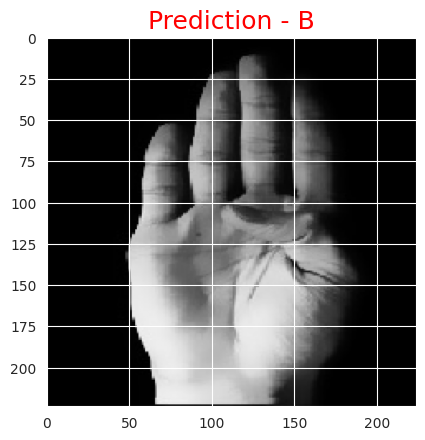

In [ ]:
pred_b = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/bilateral/hand_b_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 25ms/step


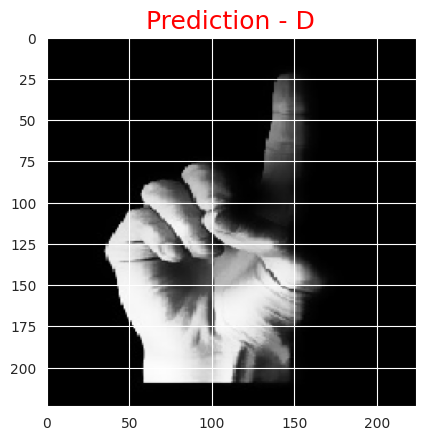

In [ ]:
pred_d = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/bilateral/hand_d_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 39ms/step


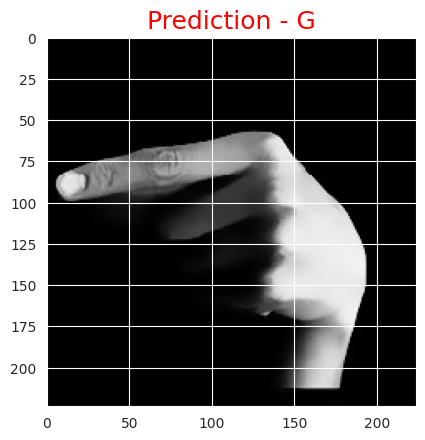

In [ ]:
pred_g = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/bilateral/hand_g_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 44ms/step


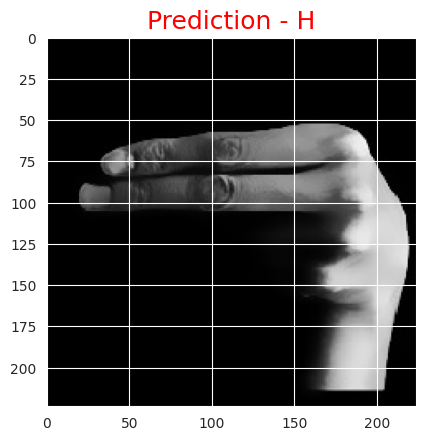

In [ ]:
pred_h = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/bilateral/hand_h_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 41ms/step


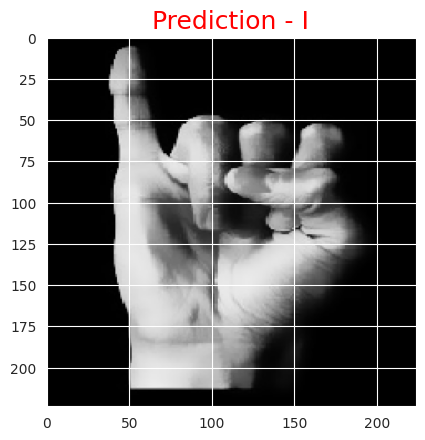

In [ ]:
pred_i = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/bilateral/hand_i_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 47ms/step


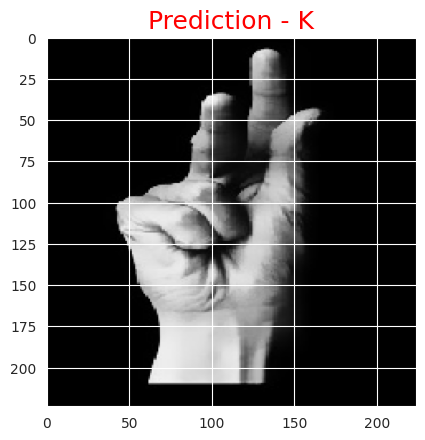

In [ ]:
pred_k = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/bilateral/hand_k_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 38ms/step


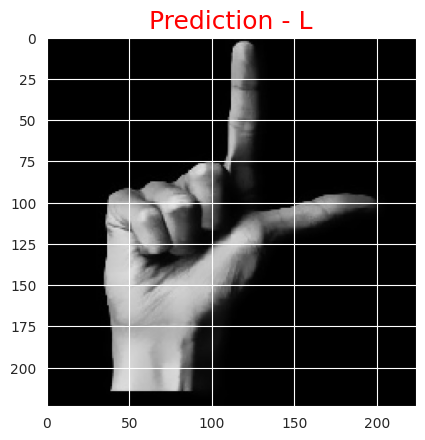

In [ ]:
pred_l = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/bilateral/hand_l_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 30ms/step


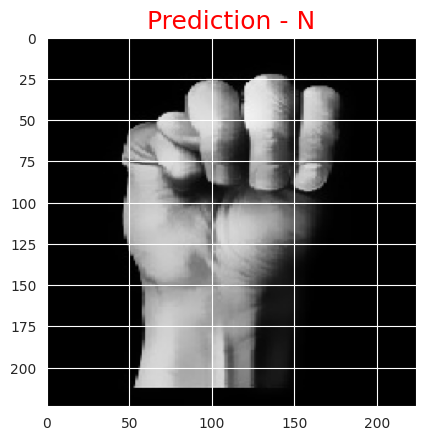

In [ ]:
pred_m = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/bilateral/hand_m_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 34ms/step


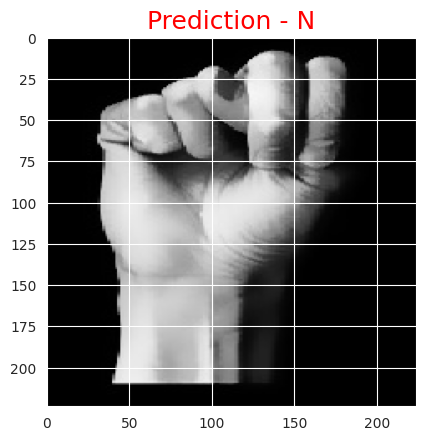

In [ ]:
pred_n = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/bilateral/hand_n_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 52ms/step


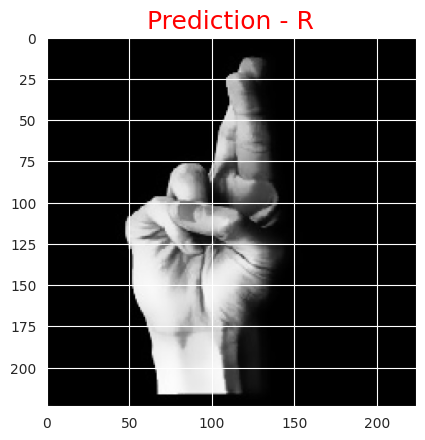

In [ ]:
pred_r = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/bilateral/hand_r_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 35ms/step


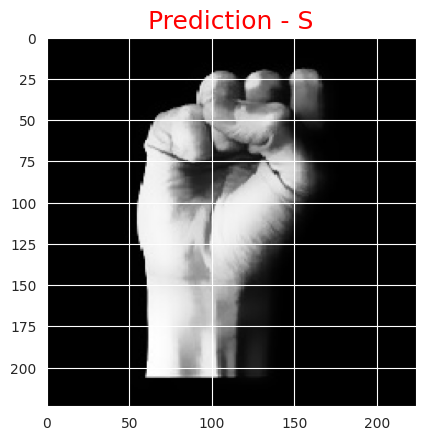

In [ ]:
pred_s = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/bilateral/hand_s_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 45ms/step


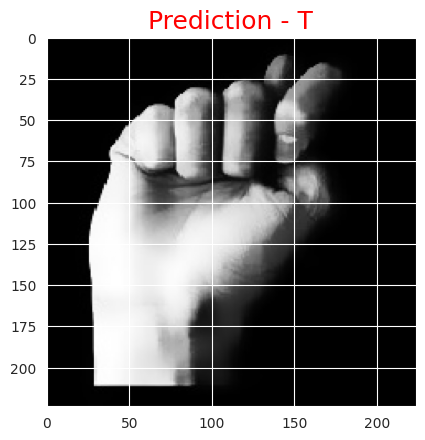

In [ ]:
pred_t = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/bilateral/hand_t_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 41ms/step


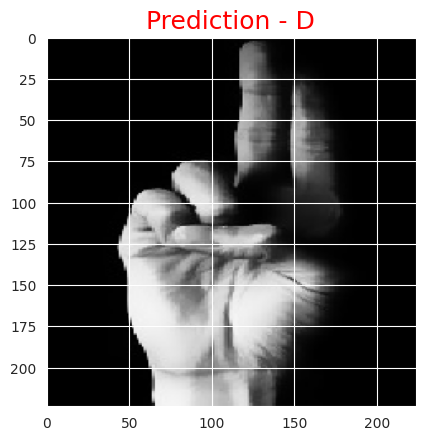

In [ ]:
pred_u = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/bilateral/hand_u_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 52ms/step


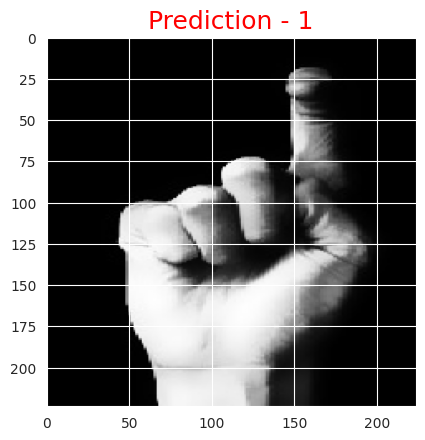

In [ ]:
pred_x = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/bilateral/hand_x_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 28ms/step


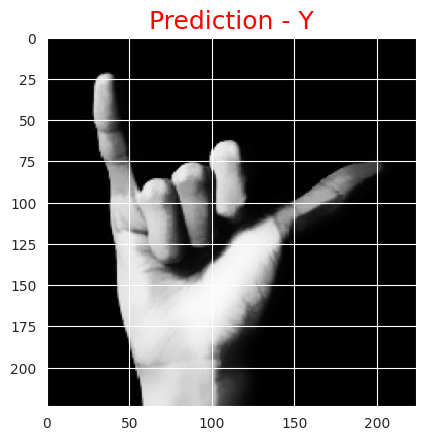

In [ ]:
pred_y = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/bilateral/hand_y_seg_1_cropped.jpeg', model)

# **ResNet50v2**

In [ ]:
model = model_50v2

1/1 [==============================] - 1s 1s/step


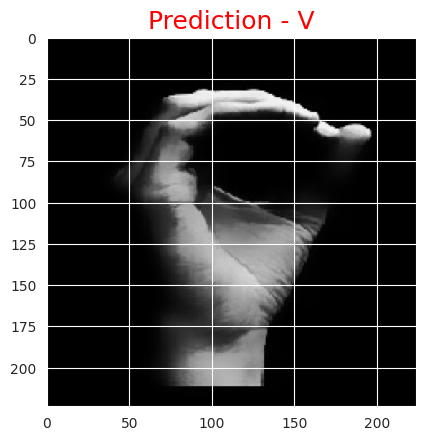

In [ ]:
pred_0 = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/bilateral/hand_0_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 38ms/step


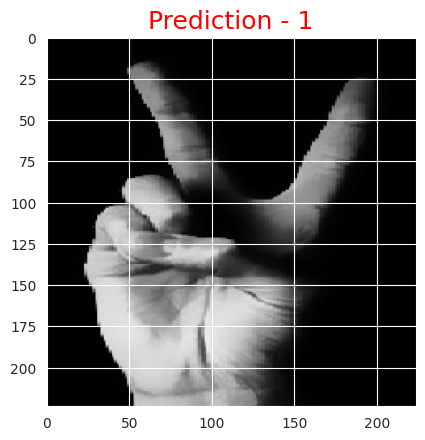

In [ ]:
pred_2 = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/bilateral/hand_2_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 54ms/step


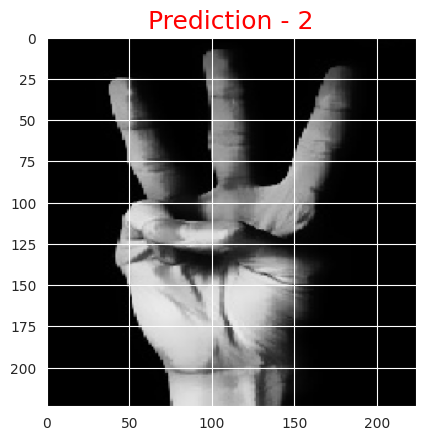

In [ ]:
pred_6 = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/bilateral/hand_6_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 36ms/step


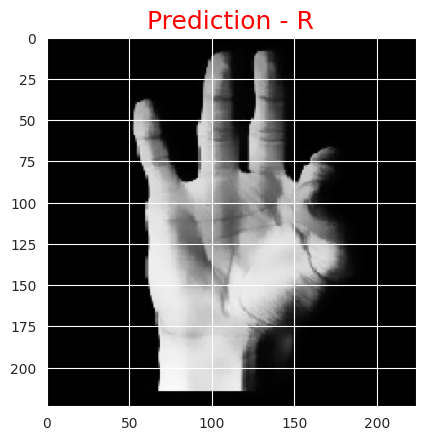

In [ ]:
pred_9 = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/bilateral/hand_9_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 24ms/step


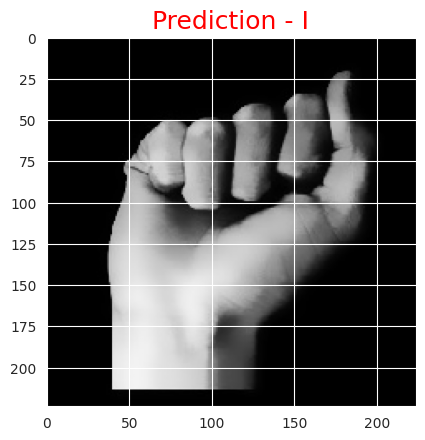

In [ ]:
pred_a = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/bilateral/hand_a_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 32ms/step


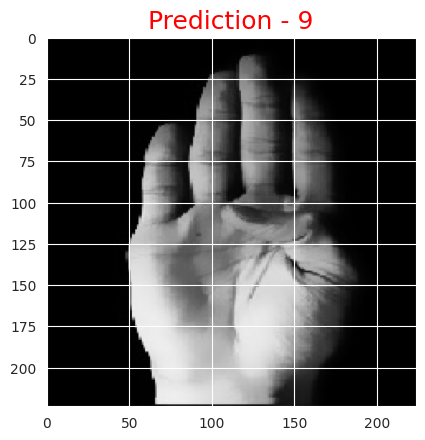

In [ ]:
pred_b = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/bilateral/hand_b_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 26ms/step


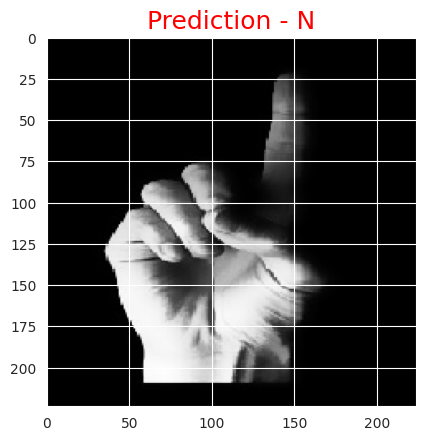

In [ ]:
pred_d = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/bilateral/hand_d_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 22ms/step


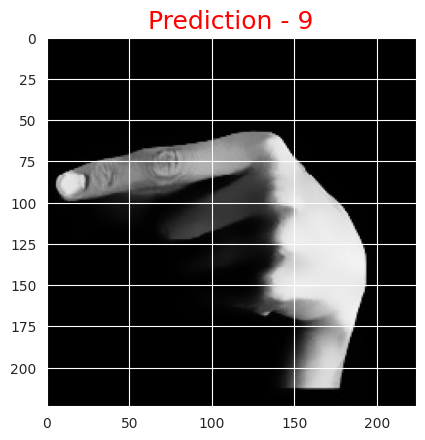

In [ ]:
pred_g = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/bilateral/hand_g_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 23ms/step


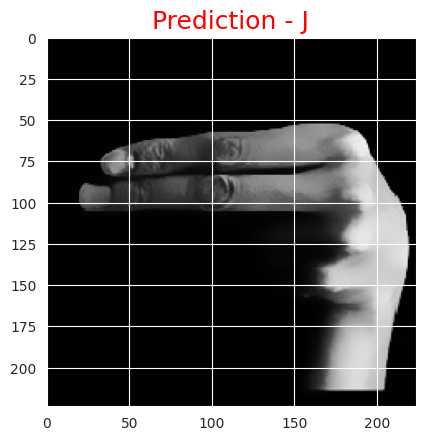

In [ ]:
pred_h = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/bilateral/hand_h_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 22ms/step


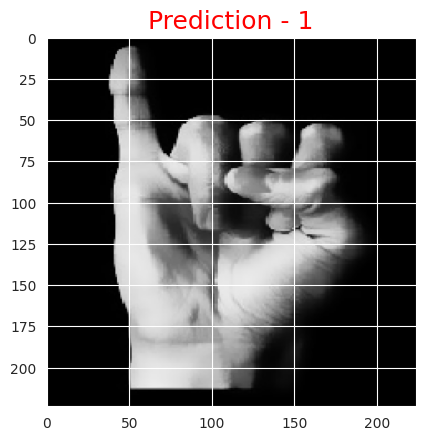

In [ ]:
pred_i = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/bilateral/hand_i_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 24ms/step


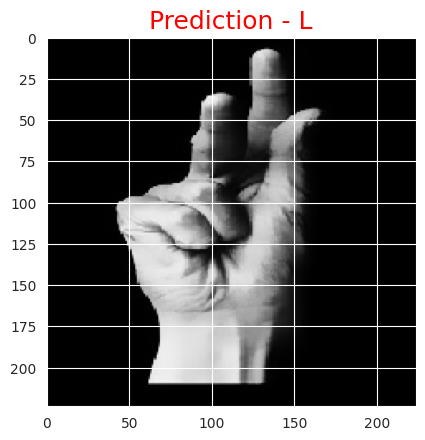

In [ ]:
pred_k = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/bilateral/hand_k_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 22ms/step


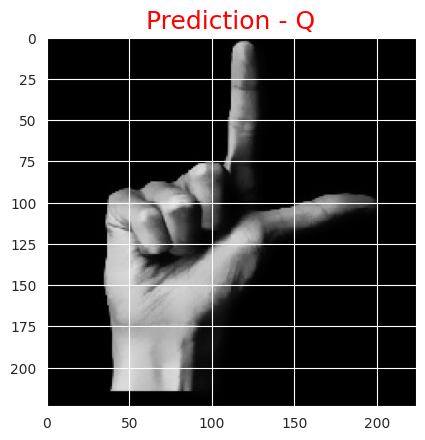

In [ ]:
pred_l = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/bilateral/hand_l_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 23ms/step


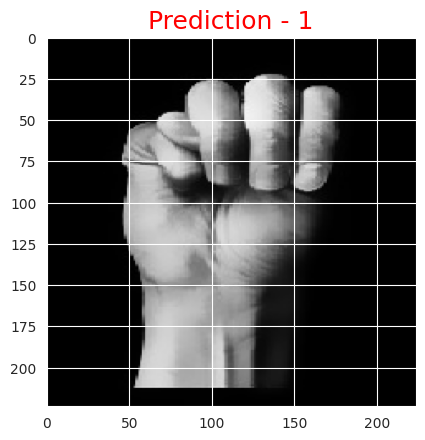

In [ ]:
pred_m = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/bilateral/hand_m_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 24ms/step


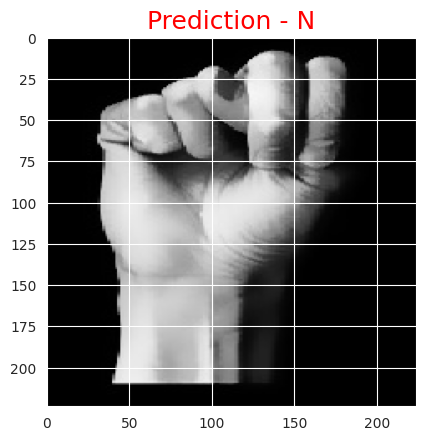

In [ ]:
pred_n = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/bilateral/hand_n_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 23ms/step


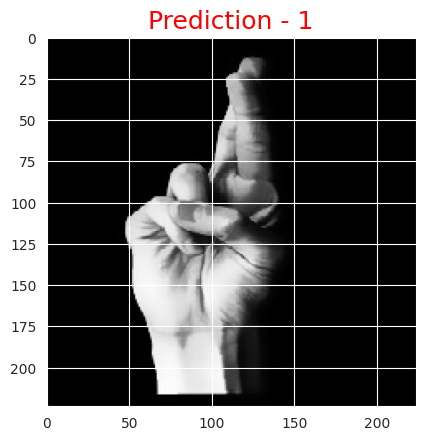

In [ ]:
pred_r = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/bilateral/hand_r_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 22ms/step


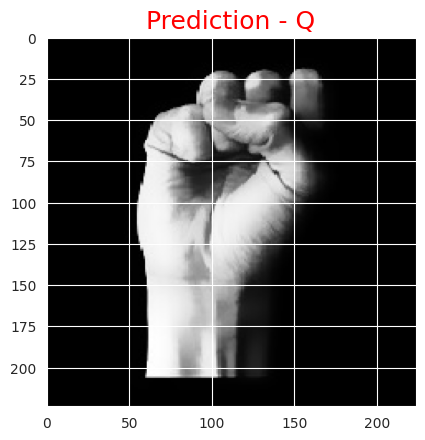

In [ ]:
pred_s = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/bilateral/hand_s_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 29ms/step


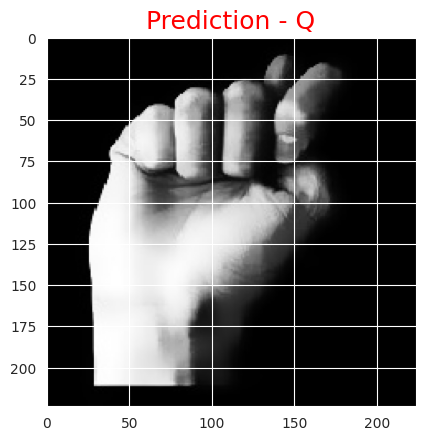

In [ ]:
pred_t = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/bilateral/hand_t_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 23ms/step


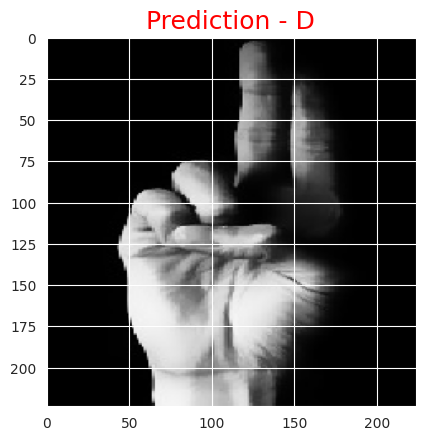

In [ ]:
pred_u = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/bilateral/hand_u_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 25ms/step


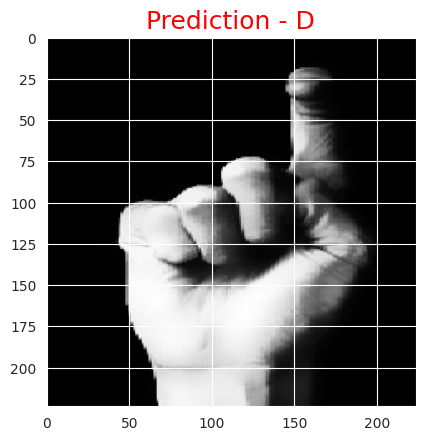

In [ ]:
pred_x = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/bilateral/hand_x_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 22ms/step


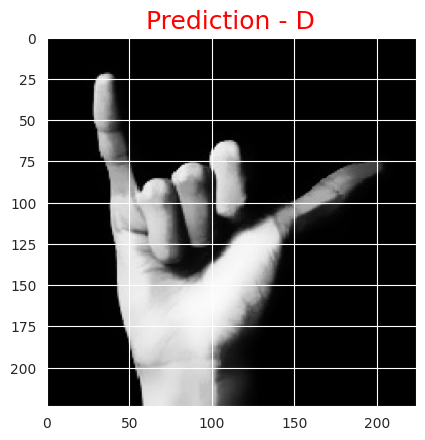

In [ ]:
pred_y = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/bilateral/hand_y_seg_1_cropped.jpeg', model)

# **InceptionResNet50v2**

In [ ]:
model = model_irv2

1/1 [==============================] - 1s 853ms/step


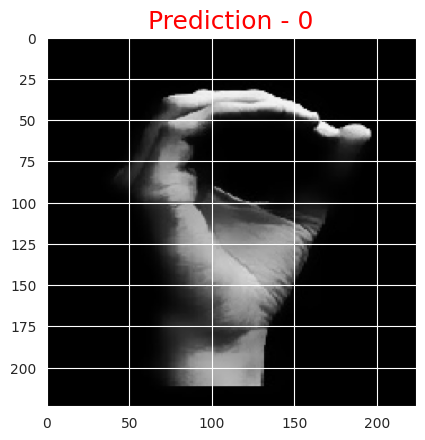

In [ ]:
pred_0 = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/bilateral/hand_0_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 34ms/step


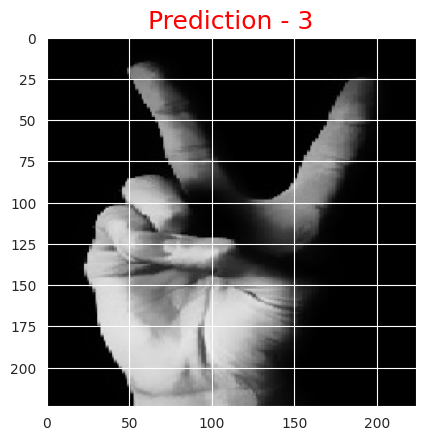

In [ ]:
pred_2 = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/bilateral/hand_2_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 39ms/step


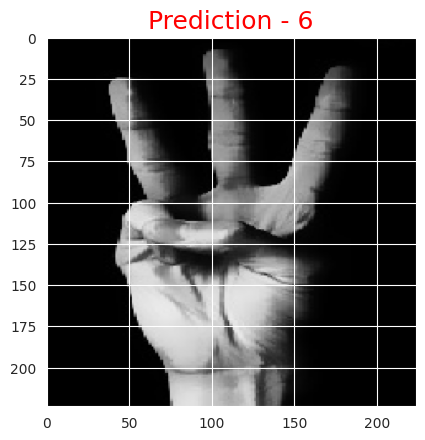

In [ ]:
pred_6 = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/bilateral/hand_6_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 32ms/step


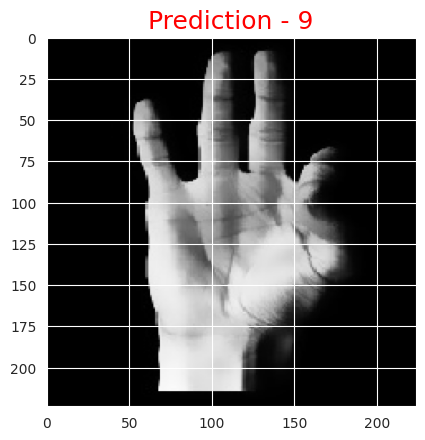

In [ ]:
pred_9 = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/bilateral/hand_9_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 33ms/step


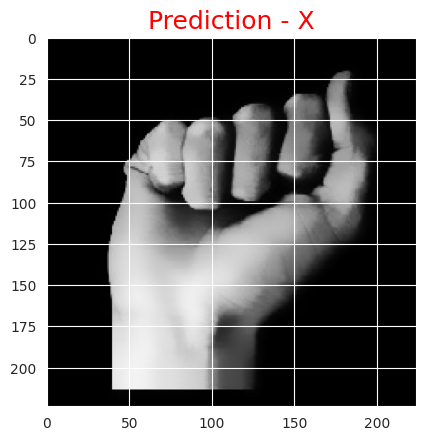

In [ ]:
pred_a = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/bilateral/hand_a_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 36ms/step


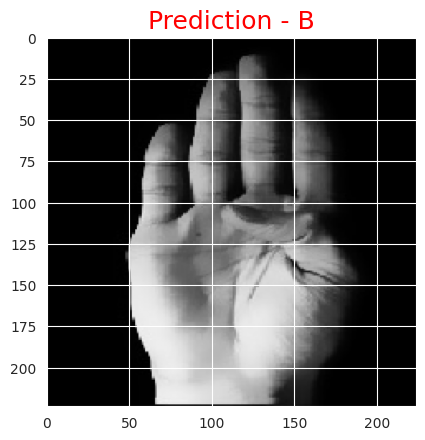

In [ ]:
pred_b = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/bilateral/hand_b_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 32ms/step


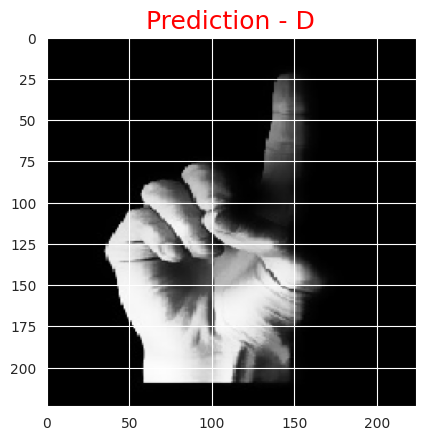

In [ ]:
pred_d = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/bilateral/hand_d_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 25ms/step


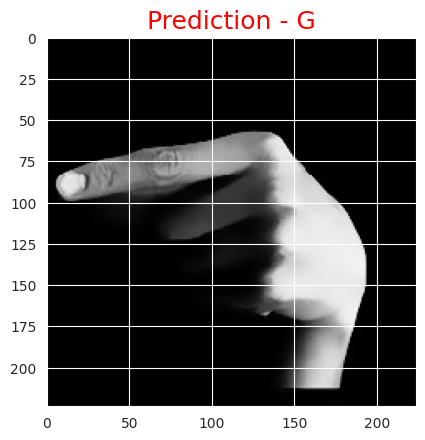

In [ ]:
pred_g = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/bilateral/hand_g_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 35ms/step


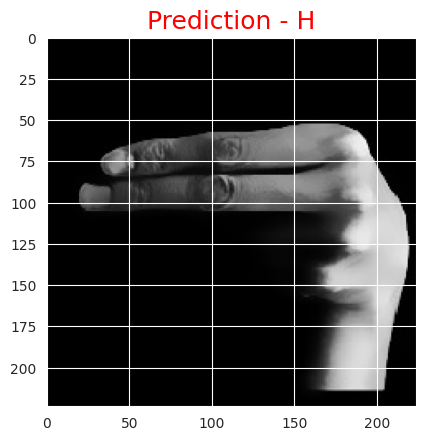

In [ ]:
pred_h = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/bilateral/hand_h_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 25ms/step


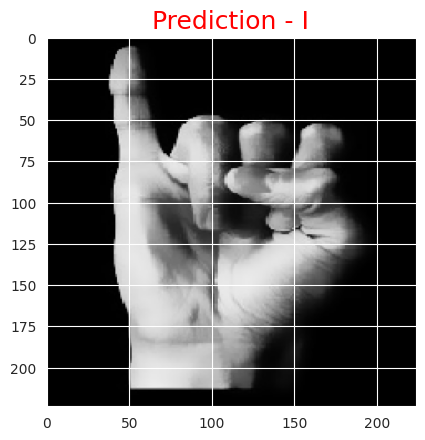

In [ ]:
pred_i = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/bilateral/hand_i_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 25ms/step


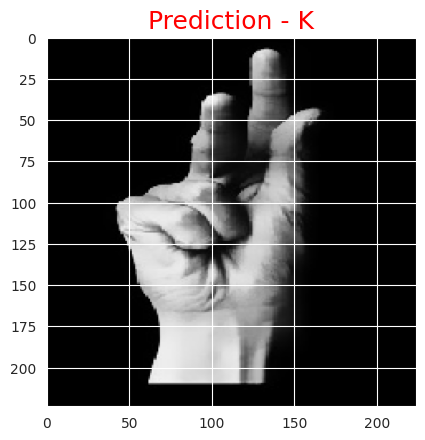

In [ ]:
pred_k = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/bilateral/hand_k_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 24ms/step


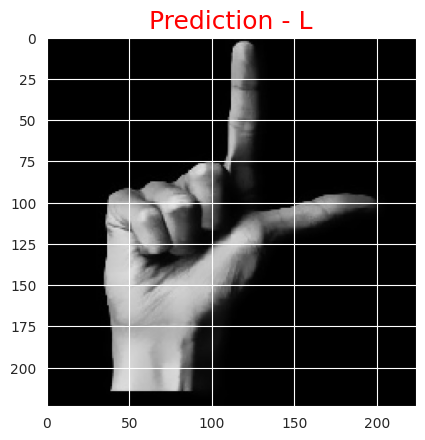

In [ ]:
pred_l = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/bilateral/hand_l_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 26ms/step


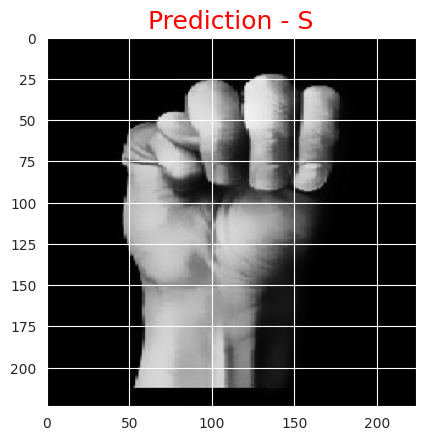

In [ ]:
pred_m = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/bilateral/hand_m_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 27ms/step


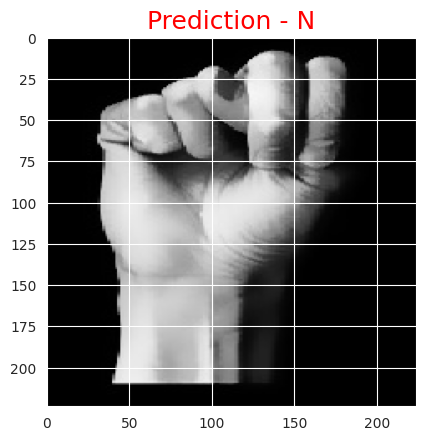

In [ ]:
pred_n = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/bilateral/hand_n_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 27ms/step


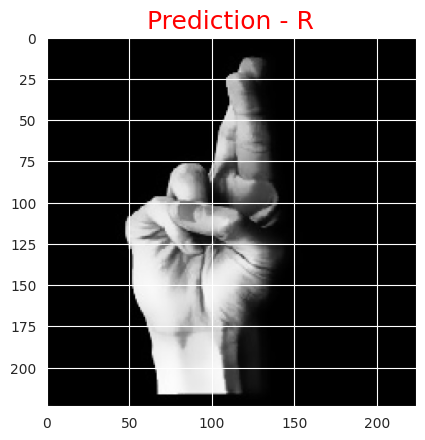

In [ ]:
pred_r = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/bilateral/hand_r_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 25ms/step


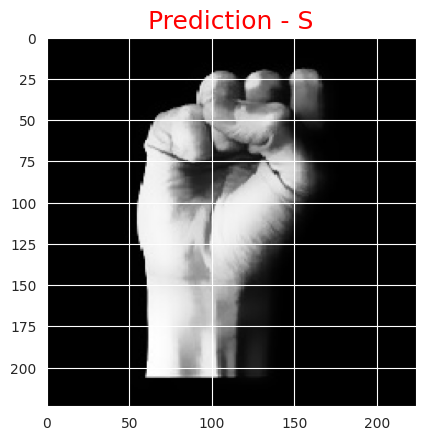

In [ ]:
pred_s = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/bilateral/hand_s_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 24ms/step


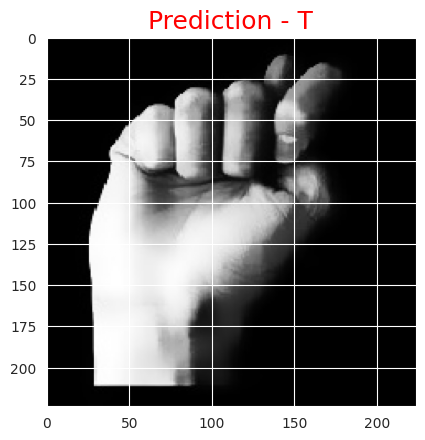

In [ ]:
pred_t = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/bilateral/hand_t_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 27ms/step


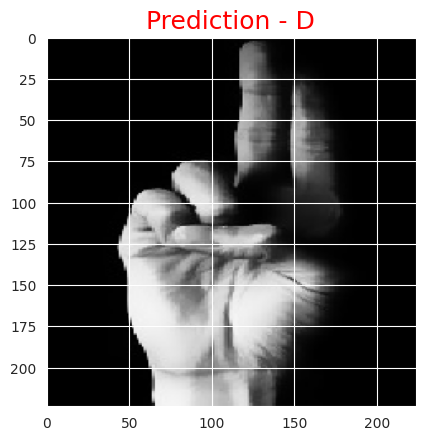

In [ ]:
pred_u = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/bilateral/hand_u_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 25ms/step


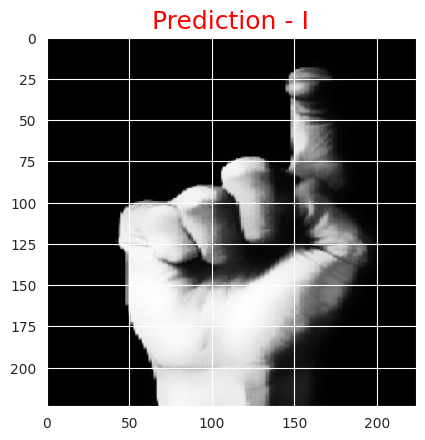

In [ ]:
pred_x = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/bilateral/hand_x_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 29ms/step


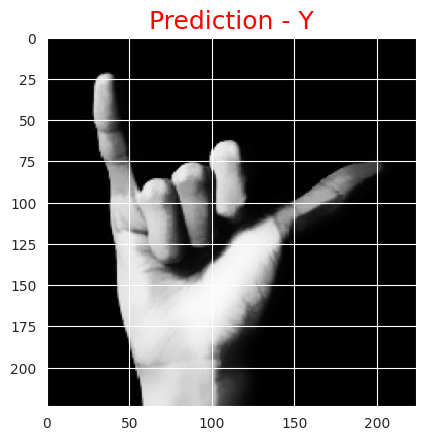

In [ ]:
pred_y = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/bilateral/hand_y_seg_1_cropped.jpeg', model)

# **MobileNet**

In [ ]:
model = model_mnet

1/1 [==============================] - 0s 488ms/step


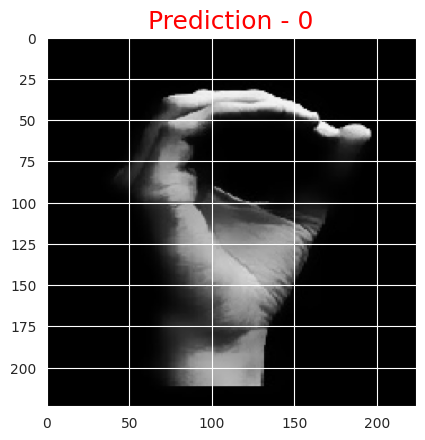

In [ ]:
pred_0 = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/bilateral/hand_0_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 22ms/step


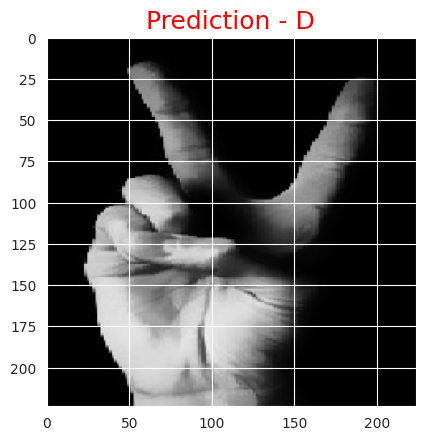

In [ ]:
pred_2 = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/bilateral/hand_2_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 22ms/step


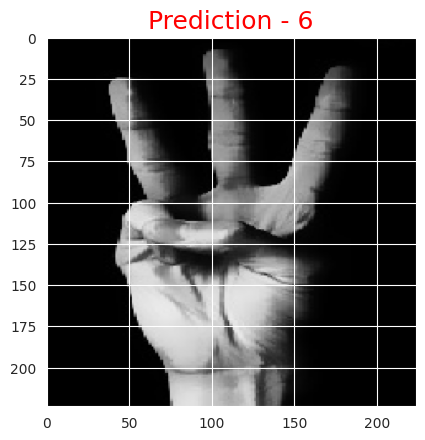

In [ ]:
pred_6 = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/bilateral/hand_6_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 31ms/step


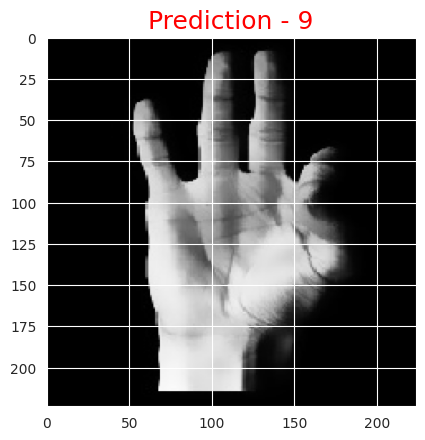

In [ ]:
pred_9 = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/bilateral/hand_9_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 21ms/step


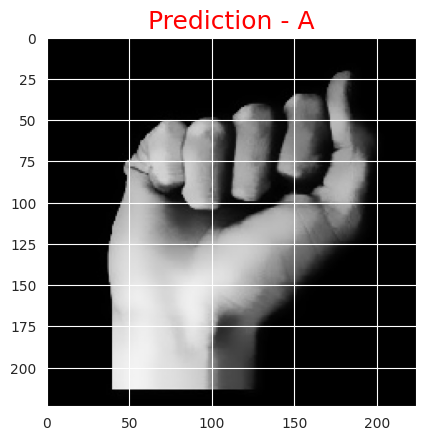

In [ ]:
pred_a = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/bilateral/hand_a_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 38ms/step


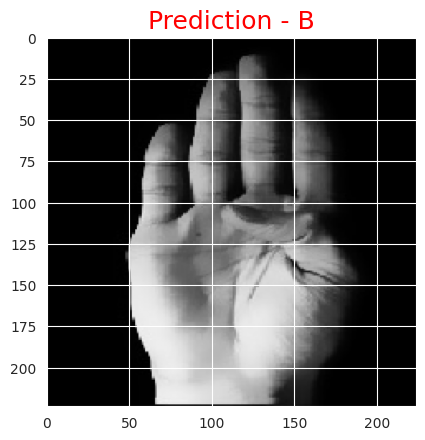

In [ ]:
pred_b = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/bilateral/hand_b_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 31ms/step


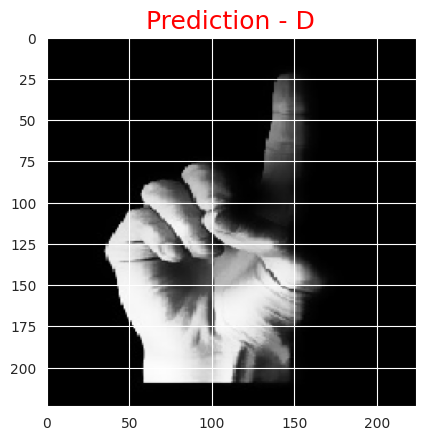

In [ ]:
pred_d = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/bilateral/hand_d_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 30ms/step


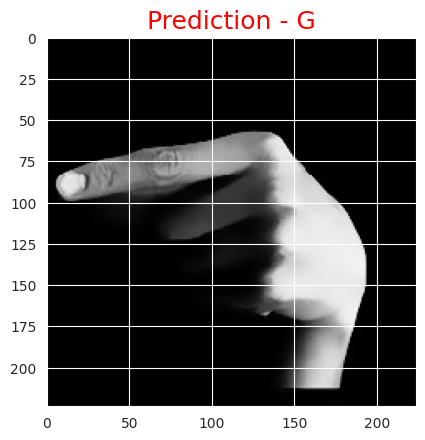

In [ ]:
pred_g = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/bilateral/hand_g_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 29ms/step


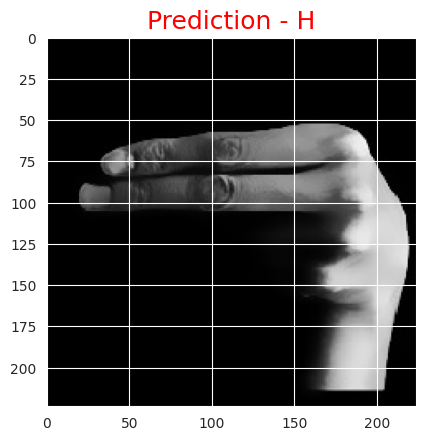

In [ ]:
pred_h = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/bilateral/hand_h_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 31ms/step


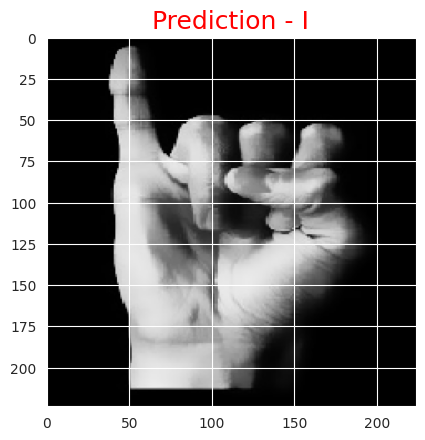

In [ ]:
pred_i = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/bilateral/hand_i_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 32ms/step


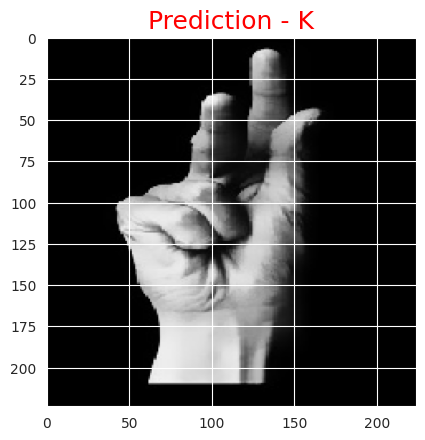

In [ ]:
pred_k = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/bilateral/hand_k_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 32ms/step


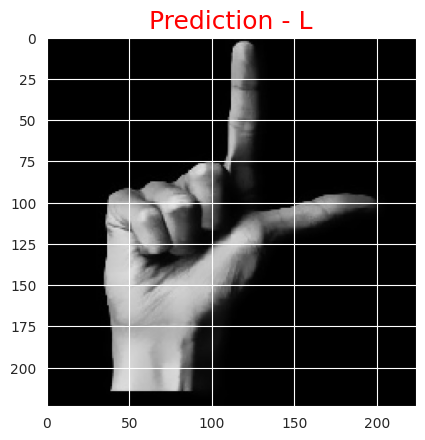

In [ ]:
pred_l = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/bilateral/hand_l_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 30ms/step


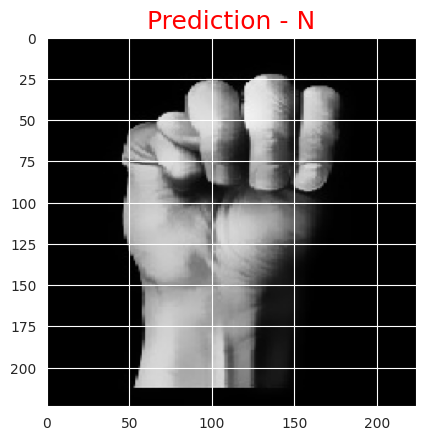

In [ ]:
pred_m = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/bilateral/hand_m_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 33ms/step


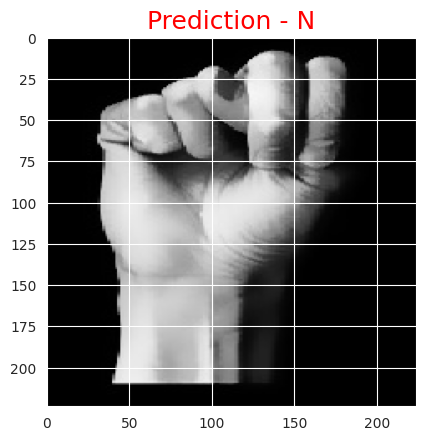

In [ ]:
pred_n = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/bilateral/hand_n_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 32ms/step


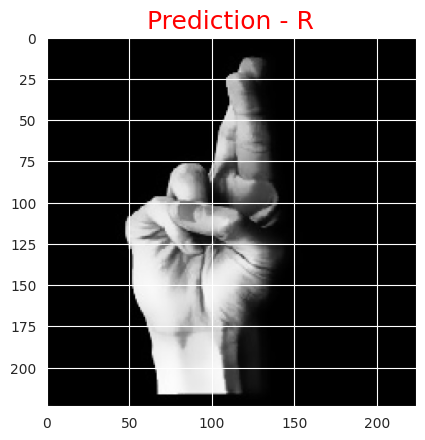

In [ ]:
pred_r = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/bilateral/hand_r_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 35ms/step


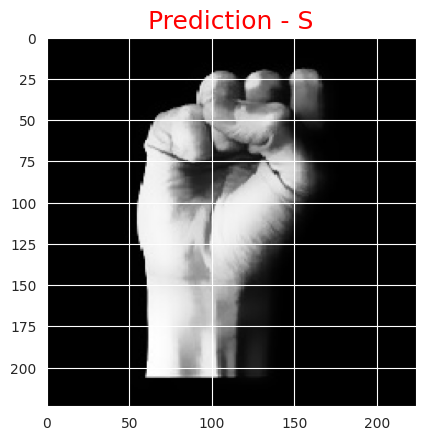

In [ ]:
pred_s = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/bilateral/hand_s_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 21ms/step


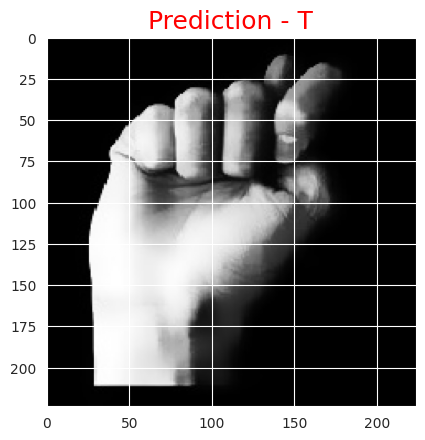

In [ ]:
pred_t = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/bilateral/hand_t_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 20ms/step


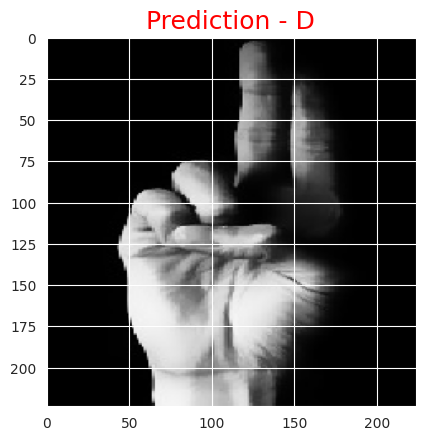

In [ ]:
pred_u = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/bilateral/hand_u_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 20ms/step


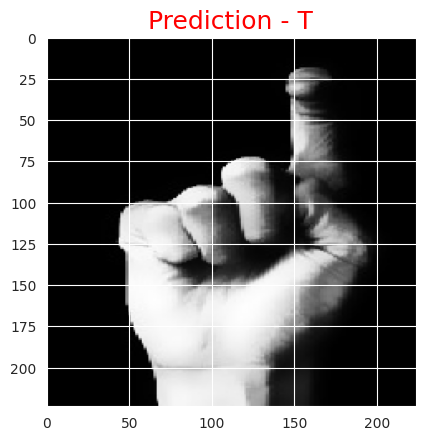

In [ ]:
pred_x = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/bilateral/hand_x_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 21ms/step


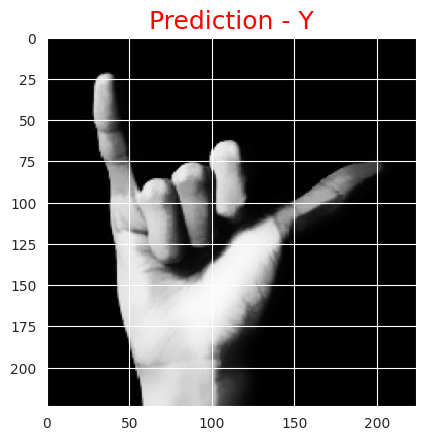

In [ ]:
pred_y = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/bilateral/hand_y_seg_1_cropped.jpeg', model)

# **MobileNetV2**

In [ ]:
model = model_mnetv2

1/1 [==============================] - 1s 800ms/step


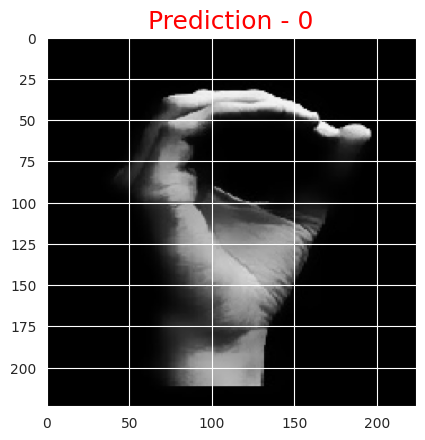

In [ ]:
pred_0 = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/bilateral/hand_0_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 24ms/step


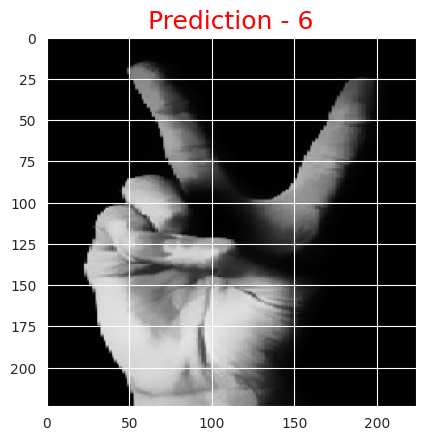

In [ ]:
pred_2 = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/bilateral/hand_2_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 22ms/step


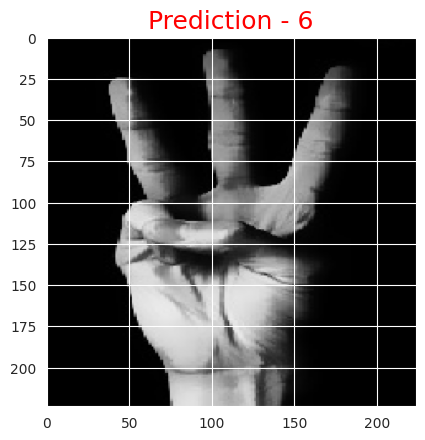

In [ ]:
pred_6 = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/bilateral/hand_6_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 21ms/step


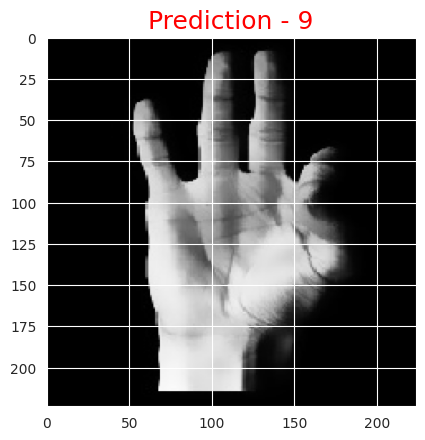

In [ ]:
pred_9 = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/bilateral/hand_9_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 29ms/step


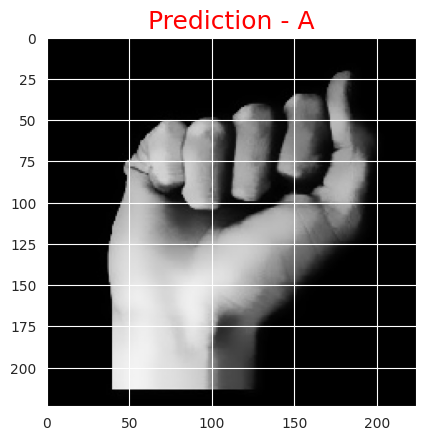

In [ ]:
pred_a = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/bilateral/hand_a_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 33ms/step


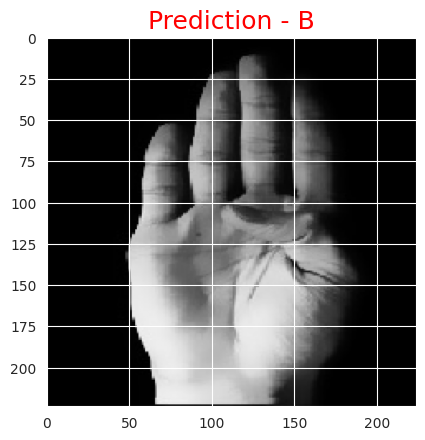

In [ ]:
pred_b = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/bilateral/hand_b_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 23ms/step


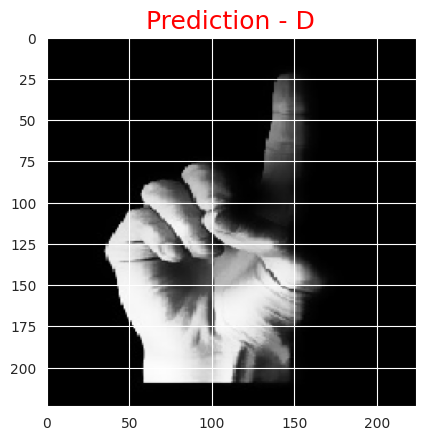

In [ ]:
pred_d = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/bilateral/hand_d_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 23ms/step


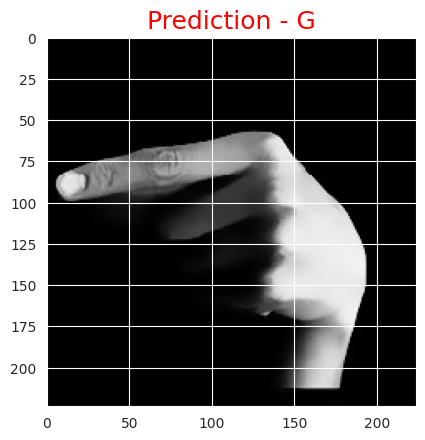

In [ ]:
pred_g = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/bilateral/hand_g_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 23ms/step


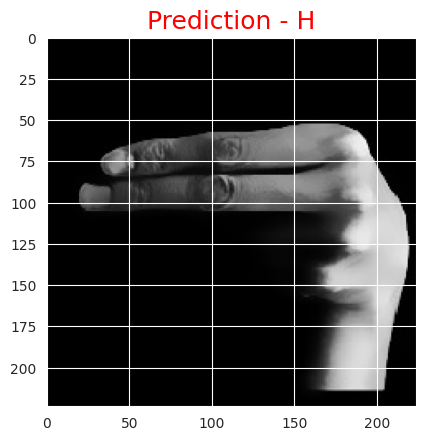

In [ ]:
pred_h = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/bilateral/hand_h_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 22ms/step


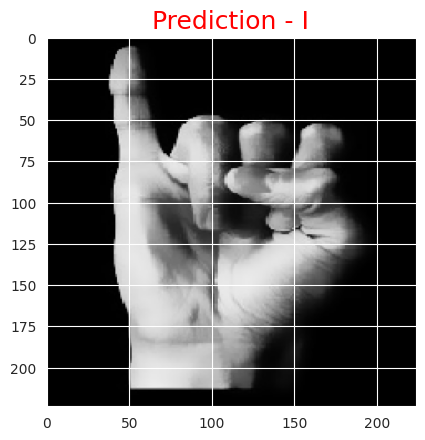

In [ ]:
pred_i = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/bilateral/hand_i_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 22ms/step


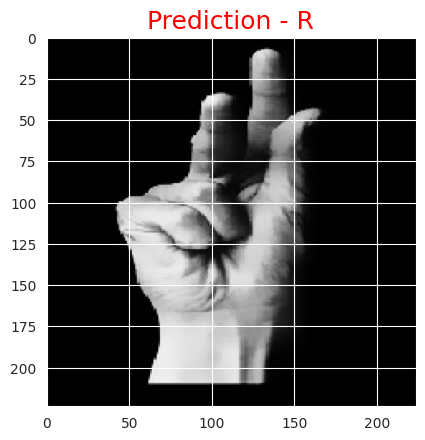

In [ ]:
pred_k = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/bilateral/hand_k_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 25ms/step


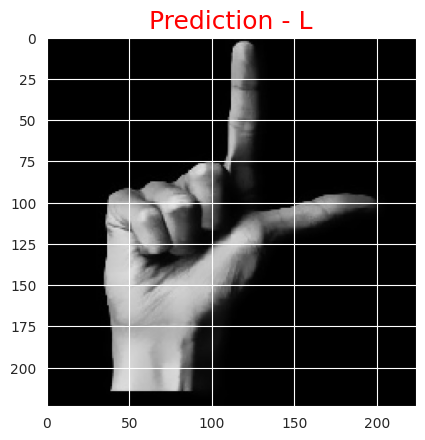

In [ ]:
pred_l = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/bilateral/hand_l_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 29ms/step


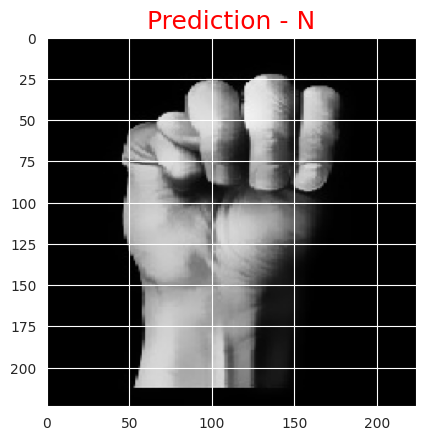

In [ ]:
pred_m = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/bilateral/hand_m_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 34ms/step


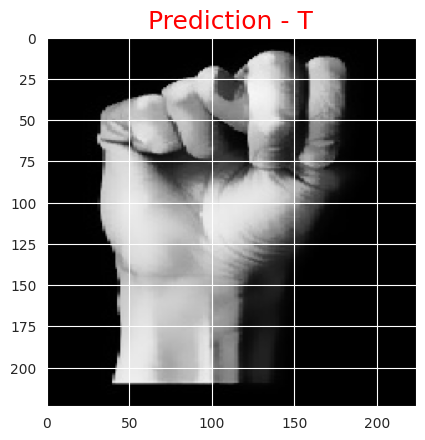

In [ ]:
pred_n = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/bilateral/hand_n_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 43ms/step


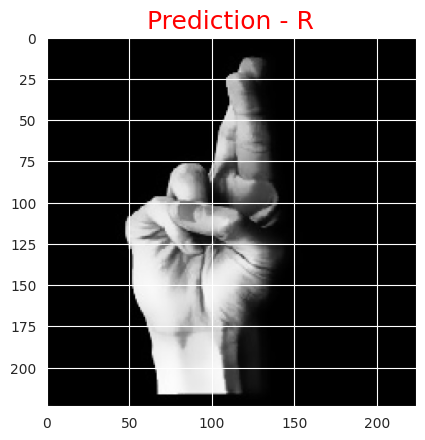

In [ ]:
pred_r = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/bilateral/hand_r_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 28ms/step


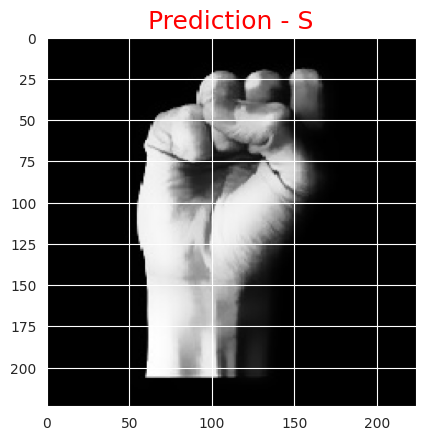

In [ ]:
pred_s = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/bilateral/hand_s_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 53ms/step


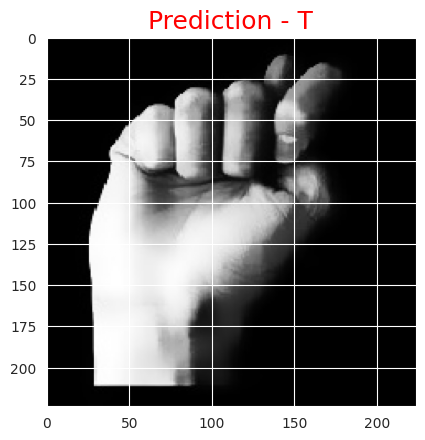

In [ ]:
pred_t = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/bilateral/hand_t_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 35ms/step


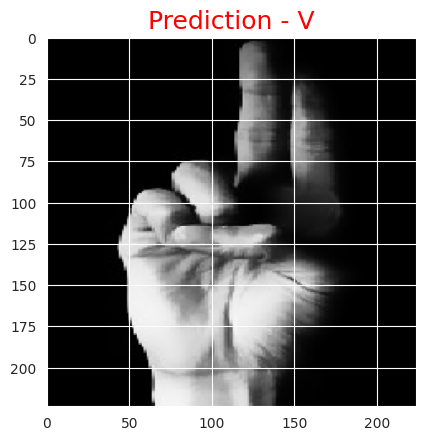

In [ ]:
pred_u = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/bilateral/hand_u_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 34ms/step


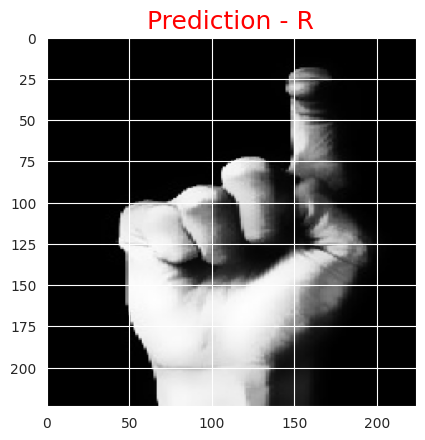

In [ ]:
pred_x = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/bilateral/hand_x_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 31ms/step


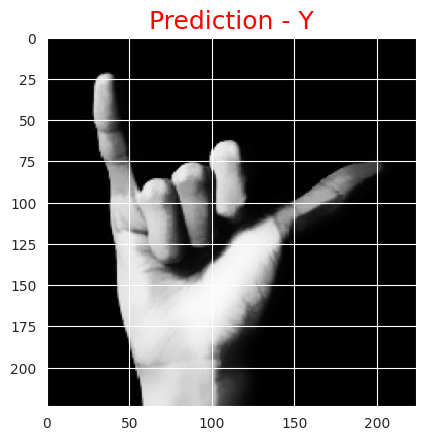

In [ ]:
pred_y = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/bilateral/hand_y_seg_1_cropped.jpeg', model)